# **Data Cleaning Practices**

In this lab, we will apply learned concepts from Day 1-2 lectures to perform data cleaning on a given Airbnb data set. 

This dataset (raw.csv) contains 30k+ records on hotels in the top-10 tourist destinations and major US metropolitan areas sraped from Airbnb.com. 
Each data record has 40 attributes including the number of bedrooms, price, location, etc. 
The attribute "pop2016" means population of the zipcode location (area) in year 2016.
Demographic and economic attributes were scraped from city-data.com. 

Updated: short description for attributes:

### **House specific features, collected from Airbnb.com:**
* Bathrooms: The number of bathrooms in the listing
* Bedrooms: The number of bedrooms
* Beds: The number of bed(s)
* LocationName: Location of the house
* NumGuests: Maximum number of guests can hold
* NumReviews: number of reviews received
* Price: daily price in local currency

* **Rating:** Y/N - whether the rating of each house is 5 or not
* latitude: location information latitude
* longitude: location information longitude
* zipcode: zipcode of the house

### **demographic and economic attributes based on zipcode, collected from city-data.com (means the same zipcode should share the same value for each of the following attributes)**
* pop2016: popularity of the area reported in 2016
* pop2010: popularity of the area reported in 2010
* pop2000: popularity of the area reported in 2000
* cost_living_index: a U.S standarded index for cost living measurement
* land_area: space of land
* water_area: space of water area
* pop_density: density of population 
* number of males: within the area population
* number of females: within the area population
* prop taxes paid 2016: Median real estate property taxes paid for housing units in 2016
* median taxes: median of taxes paid by house owners in the area
* median house value: median of house value in the area
* median household income: median of income of house owners in the area
* median monthly onwer costs (with mortgage): median monthly cost of house owner including mortgage
* median monthly onwer costs (no mortgage): median monthly cost of house owner without considering mortgage
* median gross rent: the monthly rent agreed or contracted for plus the estimated monthly cost of utilities and fuels.
* median asking price for vacant for-sale home/condo: median asking price for for-sale home in the area
* unemployment: umemployment ratio of the area

### **aggregated features for Abnb by zipcode**
* Number of Homes	Count of Abnb:	number of Abnb houses in this area
* Density of Abnb (%): ratio of Abnb houses in this area
* Average Abnb Price (by zipcode): aggregated by zipcode
* Average NumReviews (by zipcode): aggregated by zipcode	
* Average Rating (by zipcode): aggregated by zipcode
* Average Number of Bathrooms (by zipcode): aggregated by zipcode
* Average Number of Bedrooms (by zipcode): aggregated by zipcode
* Average Number of Beds (by zipcode): aggregated by zipcode
* Average Number of Guests (by zipcode): aggregated by zipcode



The prediction label is Rating of house.

## **Submission: submit via onq.** 


In [ ]:
# Step 1: Import needed libraries. E.g., pandas, missingno, and sklearn

# (for mathematical operations) used for working with arrays. It also has functions for working in domain of linear algebra, fourier transform, and matrices.
import numpy as np

import pandas as pd

# for split data
from sklearn.model_selection import train_test_split

# provides a series of visualisations to understand the presence and distribution of missing data within data. we can identify where missing values occur, the extent of the missingness and whether any of the missing values are correlated with each other.
import missingno as msno
import matplotlib.pyplot as plt   # (for data visualization) for creating static, animated, and interactive visualizations
import seaborn as sns
from scipy.stats import norm
from scipy import stats

# For Convert categorical values to numerical values
from sklearn.preprocessing import OneHotEncoder, LabelEncoder

# select the best parameters from the listed hyperparameters.
from sklearn.model_selection import GridSearchCV

# import Random Forest Classifier
from sklearn.ensemble import RandomForestClassifier

# import XGBoost Classifier
from xgboost import XGBClassifier

from sklearn.linear_model import LogisticRegression

from sklearn import tree

# saves from multiple prints and display statements,
# will let you see multiple outputs in the same cell
# allow display of multiple outputs by running one code cell
from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = "all"

**Task 1: Read dataset and perform basic data exploration. Specially, you should write code to explore the types of data provided**

In [ ]:
# load data and read it from sdf files data
df = pd.read_csv('raw.csv')

# Show data 
df

,Bathrooms,Bedrooms,Beds,LocationName,NumGuests,NumReviews,Price,Rating,latitude,longitude,...,Number of Homes,Count of Abnb,Density of Abnb (%),Average Abnb Price (by zipcode),Average NumReviews (by zipcode),Average Rating (by zipcode),Average Number of Bathrooms (by zipcode),Average Number of Bedrooms (by zipcode),Average Number of Beds (by zipcode),Average Number of Guests (by zipcode)
0,1.0,1.0,1.0,Atlanta,2.0,7.0,38.0,Y,33.75515,-84.32992,...,5306.0,75,1.413494,104.743243,35.280702,4.944444,1.459459,1.845070,2.146667,2.146667
1,1.0,1.0,1.0,Atlanta,2.0,15.0,38.0,N,33.82613,-84.33963,...,10537.2,96,0.911058,103.673684,21.169231,4.847458,1.281250,1.473118,1.687500,1.687500
2,2.0,2.0,2.0,Atlanta,4.0,17.0,100.0,Y,33.75076,-84.37058,...,9114.4,200,2.194330,119.368687,40.400000,4.937500,1.375000,1.602094,1.925000,1.925000
3,1.0,1.0,1.0,Atlanta,2.0,304.0,78.0,Y,33.77059,-84.33538,...,7808.0,130,1.664959,119.914729,44.063158,4.892857,1.292308,1.603306,1.953846,1.953846
4,1.0,1.0,1.0,Atlanta,2.0,19.0,50.0,Y,33.79030,-84.40027,...,9343.6,190,2.033477,131.058511,28.444444,4.881679,1.326316,1.580838,1.968421,1.968421
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
33140,1.0,1.0,2.0,Washington,5.0,159.0,67.0,N,38.90956,-77.03107,...,5300.0,123,2.320755,135.268293,52.009174,4.800000,1.262295,1.453704,2.203252,2.203252
33141,2.0,1.0,4.0,Washington,1.0,28.0,49.0,Y,38.90920,-77.02622,...,5300.0,123,2.320755,135.268293,52.009174,4.800000,1.262295,1.453704,2.203252,2.203252
33142,1.0,1.0,1.0,Washington,2.0,106.0,120.0,Y,38.88746,-76.99119,...,11794.8,410,3.476108,127.748768,54.344444,4.900289,1.196078,1.442708,2.487805,2.487805
33143,1.0,1.0,2.0,Washington,3.0,296.0,70.0,Y,38.88535,-76.98183,...,11794.8,410,3.476108,127.748768,54.344444,4.900289,1.196078,1.442708,2.487805,2.487805


In [ ]:
# show the first 20 rows from data 
df.head(20)

,Bathrooms,Bedrooms,Beds,LocationName,NumGuests,NumReviews,Price,Rating,latitude,longitude,...,Number of Homes,Count of Abnb,Density of Abnb (%),Average Abnb Price (by zipcode),Average NumReviews (by zipcode),Average Rating (by zipcode),Average Number of Bathrooms (by zipcode),Average Number of Bedrooms (by zipcode),Average Number of Beds (by zipcode),Average Number of Guests (by zipcode)
0,1.0,1.0,1.0,Atlanta,2.0,7.0,38.0,Y,33.75515,-84.32992,...,5306.0,75,1.413494,104.743243,35.280702,4.944444,1.459459,1.845070,2.146667,2.146667
1,1.0,1.0,1.0,Atlanta,2.0,15.0,38.0,N,33.82613,-84.33963,...,10537.2,96,0.911058,103.673684,21.169231,4.847458,1.281250,1.473118,1.687500,1.687500
2,2.0,2.0,2.0,Atlanta,4.0,17.0,100.0,Y,33.75076,-84.37058,...,9114.4,200,2.194330,119.368687,40.400000,4.937500,1.375000,1.602094,1.925000,1.925000
3,1.0,1.0,1.0,Atlanta,2.0,304.0,78.0,Y,33.77059,-84.33538,...,7808.0,130,1.664959,119.914729,44.063158,4.892857,1.292308,1.603306,1.953846,1.953846
4,1.0,1.0,1.0,Atlanta,2.0,19.0,50.0,Y,33.79030,-84.40027,...,9343.6,190,2.033477,131.058511,28.444444,4.881679,1.326316,1.580838,1.968421,1.968421
5,1.0,1.0,1.0,Atlanta,2.0,42.0,69.0,Y,33.77552,-84.36467,...,6912.0,210,3.038194,141.428571,36.273292,4.880795,1.285714,1.494681,1.933333,1.933333
6,1.0,1.0,1.0,Atlanta,2.0,21.0,300.0,N,33.77866,-84.38394,...,6912.0,210,3.038194,141.428571,36.273292,4.880795,1.285714,1.494681,1.933333,1.933333
7,1.0,1.0,1.0,Atlanta,2.0,40.0,95.0,Y,33.79274,-84.38750,...,9343.6,190,2.033477,131.058511,28.444444,4.881679,1.326316,1.580838,1.968421,1.968421
8,1.0,1.0,2.0,Atlanta,4.0,5.0,105.0,Y,33.77392,-84.38180,...,6912.0,210,3.038194,141.428571,36.273292,4.880795,1.285714,1.494681,1.933333,1.933333
9,1.0,NaN,2.0,Atlanta,5.0,117.0,150.0,Y,33.76864,-84.36000,...,9066.8,112,1.235276,138.459460,29.600000,4.872093,1.339286,1.704082,1.982143,1.982143


In [ ]:
# show the dimention of data (represent the shape and size of the data)
df.shape

(33145, 40)

In [ ]:
# used to print a concise summary of a DataFrame. prints information about a DataFrame including the index dtype and column dtypes, non-null values and memory usage.
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 33145 entries, 0 to 33144
Data columns (total 40 columns):
 #   Column                                              Non-Null Count  Dtype  
---  ------                                              --------------  -----  
 0   Bathrooms                                           32697 non-null  float64
 1   Bedrooms                                            29818 non-null  float64
 2   Beds                                                32831 non-null  float64
 3   LocationName                                        32826 non-null  object 
 4   NumGuests                                           32831 non-null  float64
 5   NumReviews                                          32829 non-null  float64
 6   Price                                               32507 non-null  float64
 7   Rating                                              33145 non-null  object 
 8   latitude                                            33145 non-null  float64


In [ ]:
# used for calculating some statistical data like percentile, mean and std of the numerical values of the data. it analyzes both numeric and object series and also the DataFrame column sets of mixed data types.
df.describe(include= 'all')

,Bathrooms,Bedrooms,Beds,LocationName,NumGuests,NumReviews,Price,Rating,latitude,longitude,...,Number of Homes,Count of Abnb,Density of Abnb (%),Average Abnb Price (by zipcode),Average NumReviews (by zipcode),Average Rating (by zipcode),Average Number of Bathrooms (by zipcode),Average Number of Bedrooms (by zipcode),Average Number of Beds (by zipcode),Average Number of Guests (by zipcode)
count,32697.000000,29818.000000,32831.000000,32826,32831.000000,32829.000000,32507.000000,33145,33145.000000,33145.000000,...,33103.000000,33145.000000,33103.000000,33145.000000,33145.000000,33145.000000,33145.000000,33145.000000,33145.000000,33145.000000
unique,NaN,NaN,NaN,276,NaN,NaN,NaN,2,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
top,NaN,NaN,NaN,San Diego,NaN,NaN,NaN,Y,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
freq,NaN,NaN,NaN,4462,NaN,NaN,NaN,22437,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
mean,1.215891,1.474479,1.940148,NaN,3.528373,51.086296,117.885071,NaN,36.700842,-97.464214,...,13607.586865,739.072077,36.405024,126.129854,49.056798,4.819490,1.236122,1.500675,1.952938,1.952938
std,0.547114,0.839045,1.421961,NaN,2.260288,62.151818,97.025832,NaN,5.198376,21.231474,...,9009.065538,1167.458959,96.259056,38.451543,16.486948,0.069848,0.131183,0.226741,0.356269,0.356269
min,0.000000,1.000000,0.000000,NaN,1.000000,2.000000,10.000000,NaN,25.452690,-122.544590,...,27.600000,1.000000,0.003440,16.000000,4.000000,4.250000,0.344828,0.000000,1.000000,1.000000
25%,1.000000,1.000000,1.000000,NaN,2.000000,11.000000,63.000000,NaN,32.749120,-122.259300,...,6201.600000,114.000000,0.805234,102.277778,38.602771,4.781250,1.178295,1.376812,1.732456,1.732456
50%,1.000000,1.000000,1.000000,NaN,3.000000,28.000000,90.000000,NaN,37.796110,-90.079520,...,13356.800000,284.000000,2.234994,117.697403,46.406699,4.835329,1.223011,1.461605,1.902098,1.902098
75%,1.000000,2.000000,2.000000,NaN,4.000000,67.000000,139.000000,NaN,40.647290,-75.181480,...,18168.000000,703.000000,5.538630,145.340708,57.070000,4.869565,1.317597,1.600000,2.145043,2.145043


In [ ]:
# check counts of nan values in the data by sorted data
df.isnull().sum().sort_values(ascending = False)

median taxes (with mortgage                           3621
median taxes (no mortgage)                            3527
median monthly owner costs (no mortgage)              3494
median monthly owner costs (with mortgage)            3361
median house value                                    3333
Bedrooms                                              3327
Price                                                  638
Bathrooms                                              448
LocationName                                           319
NumReviews                                             316
Beds                                                   314
NumGuests                                              314
median gross rent                                      166
median asking price for vacant for-sale home/condo     118
unemployment (%)                                       109
prop taxes paid 2016                                    87
median houshold income                                  

**Findings:** *there are missing values, exist in median taxes (with mortgage , median taxes (no mortgage), median monthly owner costs (no mortgage), median monthly owner costs (with mortgage), median house value, Bedrooms, Price, Bathrooms, LocationName, NumReviews, Beds, NumGuests, median gross rent, median asking price for vacant for-sale home/condo, unemployment (%), prop taxes paid 2016, median houshold income, Number of Homes, cost_living_index (US avg. = 100), pop2010, pop2016 and Density of Abnb (%)*

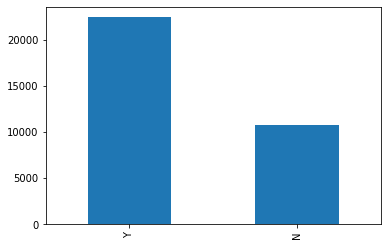

In [ ]:
df['Rating'].value_counts().plot(kind='bar')

array([<matplotlib.axes._subplots.AxesSubplot object at 0x7fbfbc9d68d0>,
      dtype=object)

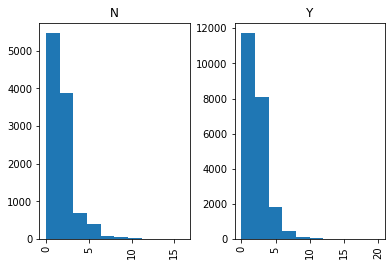

In [ ]:
# sns.catplot(x="Rating", y="total_bill", data=df)
df.hist(by='Rating',column = 'Beds')
plt.show()

/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


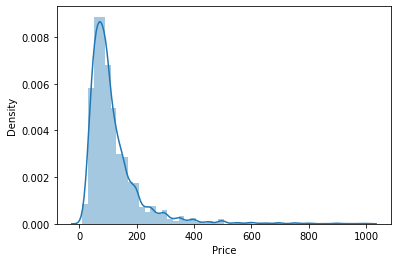

In [ ]:
#histogram
sns.distplot(df['Price']);

/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


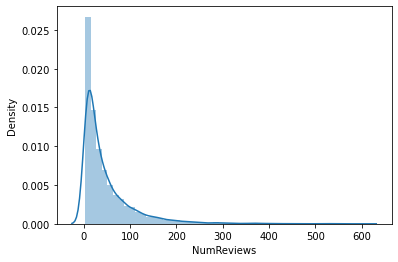

In [ ]:
#histogram
sns.distplot(df['NumReviews']);

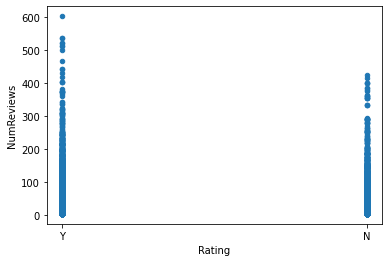

In [ ]:
#scatter plot NumReviews/Rating
var = 'Rating'
data = pd.concat([df['NumReviews'], df[var]], axis=1)
data.plot.scatter(x=var, y='NumReviews');

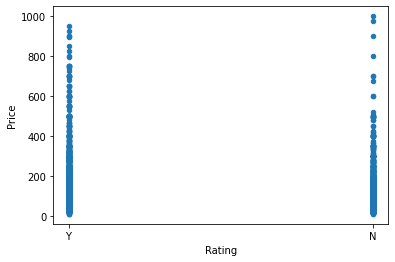

In [ ]:
#scatter plot Price/Rating
var = 'Rating'
data = pd.concat([df['Price'], df[var]], axis=1)
data.plot.scatter(x=var, y='Price');

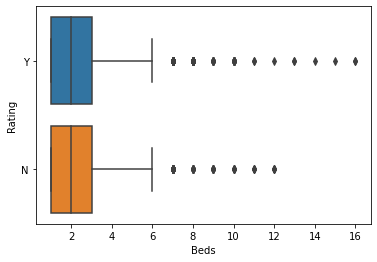

In [ ]:
#box plot Beds/Rating
var = 'Beds'
data = pd.concat([df['Rating'], df[var]], axis=1)
# f, ax = plt.subplots(figsize=(8, 6))
fig = sns.boxplot(x=var, y="Rating", data=data)
# fig.axis(ymin=0);

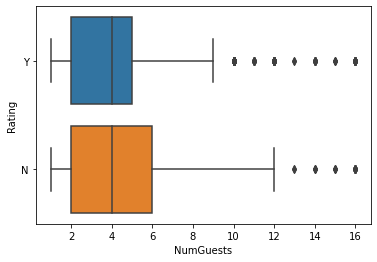

In [ ]:
#box plot Beds/Rating
var = 'NumGuests'
data = pd.concat([df['Rating'], df[var]], axis=1)
# f, ax = plt.subplots(figsize=(8, 6))
fig = sns.boxplot(x=var, y="Rating", data=data)
# fig.axis(ymin=0);

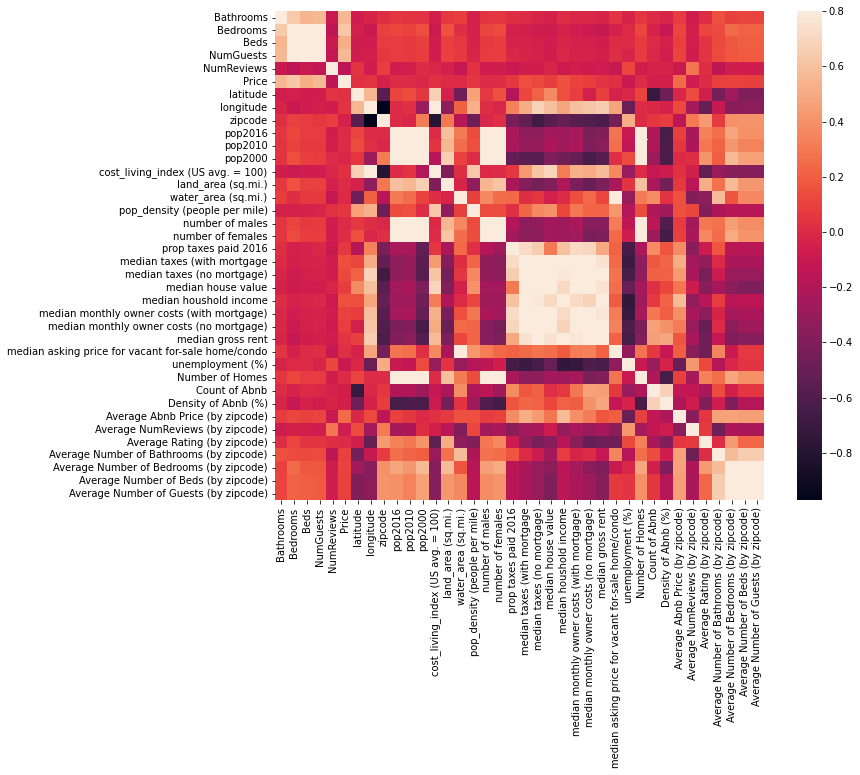

In [ ]:
#correlation matrix
corrmat = df.corr()
f, ax = plt.subplots(figsize=(12, 9))
sns.heatmap(corrmat, vmax=.8, square=True);

In [ ]:
sns.pairplot(df, size = 10)
plt.show();

/usr/local/lib/python3.7/dist-packages/seaborn/axisgrid.py:2076: UserWarning: The `size` parameter has been renamed to `height`; please update your code.
  warnings.warn(msg, UserWarning)


**Task 2: Data quality check,**

 **does duplicate entries exit in this table?** 
  *yes, the data has duplicate values. it has 4254 rows which is duplicate.*

 **Do they have consistent values?**
 *yes, there are a consistent values in the data as some of rows is repeated more than one.*

 **Briefely explain your methodology and your findings within this markdown cell, and write corresponding code in the next code cell.**

In [ ]:
# Check duplicated values and get the count it in data
# any duplicate records if yes it will return the count it otherwise it will return 0
df.duplicated().sum()

4254

**Explain:**

  *Check duplicated values and get the count it in data. if the data has any duplicate records, it will return the count otherwise it will return 0*

**Findings:**  
  * *yes, the data has duplicate values. it has 4254 rows which is duplicate.*
  * *yes, the duplicate data is consistent values*

In [ ]:
# show values of duplicate row in data
df[df.duplicated()]

,Bathrooms,Bedrooms,Beds,LocationName,NumGuests,NumReviews,Price,Rating,latitude,longitude,...,Number of Homes,Count of Abnb,Density of Abnb (%),Average Abnb Price (by zipcode),Average NumReviews (by zipcode),Average Rating (by zipcode),Average Number of Bathrooms (by zipcode),Average Number of Bedrooms (by zipcode),Average Number of Beds (by zipcode),Average Number of Guests (by zipcode)
4815,1.0,1.0,1.0,New Orleans,2.0,89.0,120.0,Y,29.96457,-90.05337,...,4704.4,703,14.943457,94.171920,83.967239,4.823668,1.211127,1.524242,2.066856,2.066856
4818,1.0,NaN,1.0,New Orleans,2.0,39.0,70.0,N,29.95745,-90.06990,...,1115.2,562,50.394548,91.775986,42.848077,4.769981,1.227758,1.337838,1.989324,1.989324
4820,2.0,2.0,3.0,New Orleans,8.0,81.0,60.0,N,29.95404,-90.07364,...,1115.2,562,50.394548,91.775986,42.848077,4.769981,1.227758,1.337838,1.989324,1.989324
4821,1.0,NaN,1.0,New Orleans,2.0,56.0,95.0,Y,29.97018,-90.09818,...,14967.6,829,5.538630,109.845499,49.687906,4.878179,1.249698,1.848285,2.343788,2.343788
4822,2.0,2.0,4.0,New Orleans,8.0,4.0,100.0,N,29.95312,-90.07124,...,1115.2,562,50.394548,91.775986,42.848077,4.769981,1.227758,1.337838,1.989324,1.989324
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
33129,1.0,2.0,2.0,Washington,6.0,17.0,60.0,N,38.87294,-76.97248,...,22297.2,227,1.018065,145.340708,27.687500,4.650000,1.367257,1.681818,2.756637,2.756637
33130,1.0,1.0,1.0,Arlington,4.0,46.0,89.0,Y,38.89807,-77.08786,...,10717.2,1265,11.803456,168.866129,31.233509,4.787722,1.254358,1.434460,1.716996,1.716996
33131,1.0,1.0,1.0,Washington,3.0,32.0,89.0,Y,38.88014,-76.98379,...,11794.8,410,3.476108,127.748768,54.344444,4.900289,1.196078,1.442708,2.487805,2.487805
33137,1.0,3.0,4.0,Arlington,6.0,18.0,130.0,Y,38.89802,-77.10512,...,10717.2,1265,11.803456,168.866129,31.233509,4.787722,1.254358,1.434460,1.716996,1.716996


**Explain:**
  *show values of duplicate rows from the data*

In [ ]:
duplicate_data =  df[df.duplicated()]
duplicate_data.duplicated().any()

True

**Task 3: Data quality check, write code and answer:**

**3.1 does missing value exit in the table?** 

 *yes, the data has missing values in the data. there are missing values in 21 columns*

**3.2 Where are the missing data?**

  *there are missing values, exist in median taxes (with mortgage , median taxes (no mortgage), median monthly owner costs (no mortgage), median monthly owner costs (with mortgage), median house value, Bedrooms, Price, Bathrooms, LocationName, NumReviews, Beds, NumGuests, median gross rent, median asking price for vacant for-sale home/condo, unemployment (%), prop taxes paid 2016, median houshold income, Number of Homes, cost_living_index (US avg. = 100), pop2010, pop2016 and Density of Abnb (%)*

**3.3 How much data is missing?**

  * *The data has null values(missing values). the maximize of null values are 3621 and The percenge is 10.924725%. this column's name is median taxes (with mortgage. the minimize of null values are 42	and The percenge is 0.126716. this column's names are Density of Abnb (%), pop2016, pop2010, cost_living_index (US avg. = 100) and Number of Homes*

* The columns have the total count of missing values and the percentage it: 
  *  median taxes (with mortgage: the total count is	3621 and the percentage is	10.924725.
  * median taxes (no mortgage):	the total count is	3527	and the percentage is	10.641122.
  * median monthly owner costs (no mortgage):	the total count is 3494	and the percentage is 10.541560.
  * median monthly owner costs (with mortgage):	the total count is 3361	and the percentage is 10.140293.
  * median house value:	the total count is 3333	and the percentage is	10.055815.
  * Bedrooms:	the total count is 3327	and the percentage is	10.037713.
  * Price:	the total count is 	638	and the percentage is	1.924876.
  * Bathrooms:	the total count is 	448	and the percentage is	1.351637.
  * LocationName:	the total count is 	319	and the percentage is	0.962438.
  * NumReviews:	the total count is 	316	and the percentage is	0.953387.
  * Beds:	the total count is 	314	and the percentage is	0.947353.
  * NumGuests:	the total count is 	314	and the percentage is	0.947353.
  * median gross rent:	the total count is 	166	and the percentage is	0.500830.
  * median asking price for vacant for-sale home/condo:	the total count is 	118	and the percentage is	0.356011.
  * unemployment (%):	the total count is 	109	and the percentage is	0.328858.
  * prop taxes paid 2016:	the total count is 	87 and the percentage is 0.262483.
  * median houshold income:	the total count is 	64	and the percentage is	0.193091.
  * Number of Homes:	the total count is 	42	and the percentage is	0.126716.
  * cost_living_index (US avg. = 100):	the total count is 	42	and the percentage is	0.126716.
  * pop2010:	the total count is 	42	and the percentage is	0.126716.
  * pop2016:	the total count is 	42	and the percentage is	0.126716.
  * Density of Abnb (%):	the total count is 	42	and the percentage is	0.126716.

**3.4 Are there any variables often missing together？** 

  *yes, There are some variables often missing together. As shown belown. the visualizate the missing values by using bar char and matrix.*
such as:

  * The Beds have missing values with Bathrooms, Bedrooms, LocationName, NumGuests, NumReviews and Price.  
  * The NumGuests have missing values with Bathrooms, Bedrooms, LocationName, Beds, NumReviews and Price. 
  * The pop2016 have missing values with pop2010, cost_living_index, prop taxes paid 2016, median taxes (with mortgage, median taxes (no mortgage), median house value, median houshold income, median monthly owner costs (with mortgage), median monthly owner costs (no mortgage), median gross rent, median asking price for vacant for-sale home/condo, unemployment (%) and Number of Homes. 
  * The pop2010 have missing values with pop2016, cost_living_index, prop taxes paid 2016, median taxes (with mortgage, median taxes (no mortgage), median house value, median houshold income, median monthly owner costs (with mortgage), median monthly owner costs (no mortgage), median gross rent, median asking price for vacant for-sale home/condo, unemployment (%) and Number of Homes.
  * The prop taxes paid 2016 have missing values with median gross rent, median asking price for vacant for-sale home/condo and unemployment (%).


**You can use missingno library to generate plots to support your claim.** 

**Summarize your findings for task 3 in this markdown cell and write corresponding code in the next code cell.**




In [ ]:
# check the data has NaN values
df.isnull().values.any()

True

In [ ]:
# Show the null values in the data if they exist any columns
df.isnull().any()

Bathrooms                                              True
Bedrooms                                               True
Beds                                                   True
LocationName                                           True
NumGuests                                              True
NumReviews                                             True
Price                                                  True
Rating                                                False
latitude                                              False
longitude                                             False
zipcode                                               False
pop2016                                                True
pop2010                                                True
pop2000                                               False
cost_living_index (US avg. = 100)                      True
land_area (sq.mi.)                                    False
water_area (sq.mi.)                     

**Findings:** 
  *yes, the data has missing values.*

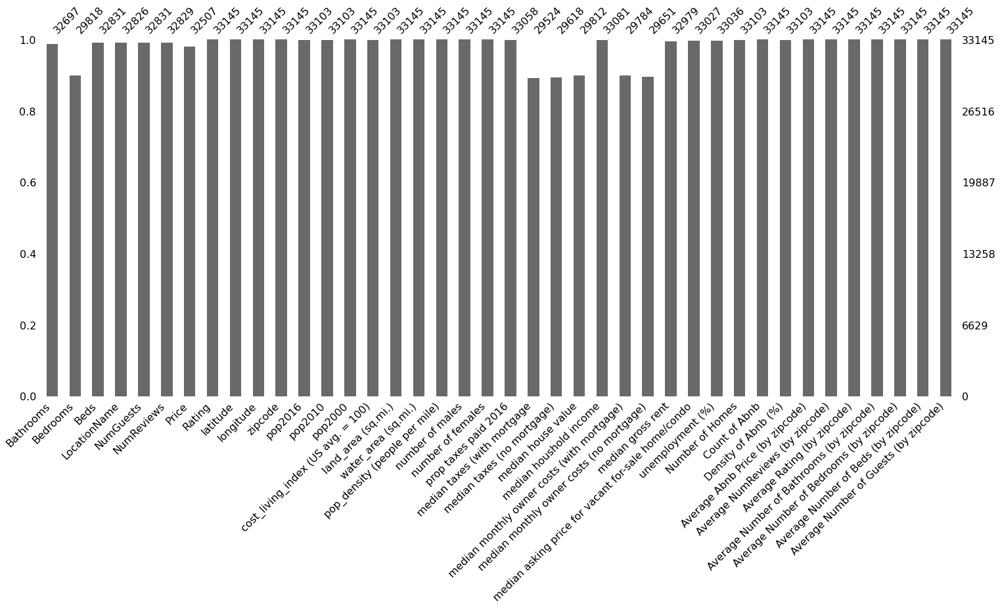

In [ ]:
# (bar chart) provides a simple plot where each bar represents a column within the data. The height of the bar indicates how complete that column
msno.bar(df)

**Explain:**
  *provides a simple plot where each bar represents a column within the data. The height of the bar indicates how complete that column*

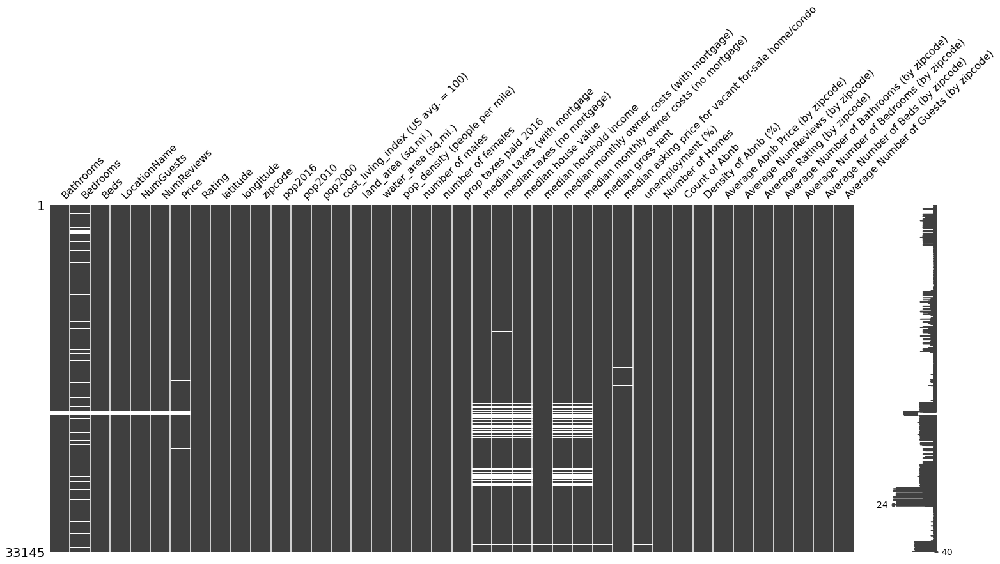

In [ ]:
# visualize missing values as a matrix
msno.matrix(df)

**Explain:**
  * *It provides a colour fill for each column. When data is present, the plot is shaded in grey (or your colour of choice), and when it is absent the plot is displayed in white.*
  * *Show where are the null values existed.*

**Finding:**

yes, There are some variables often missing together.
such as:

  * The Beds have missing values with Bathrooms, Bedrooms, LocationName, NumGuests, NumReviews and Price.  
  * The NumGuests have missing values with Bathrooms, Bedrooms, LocationName, Beds, NumReviews and Price. 
  * The pop2016 have missing values with pop2010, cost_living_index, prop taxes paid 2016, median taxes (with mortgage, median taxes (no mortgage), median house value, median houshold income, median monthly owner costs (with mortgage), median monthly owner costs (no mortgage), median gross rent, median asking price for vacant for-sale home/condo, unemployment (%) and Number of Homes. 
  * The pop2010 have missing values with pop2016, cost_living_index, prop taxes paid 2016, median taxes (with mortgage, median taxes (no mortgage), median house value, median houshold income, median monthly owner costs (with mortgage), median monthly owner costs (no mortgage), median gross rent, median asking price for vacant for-sale home/condo, unemployment (%) and Number of Homes.
  * The prop taxes paid 2016 have missing values with median gross rent, median asking price for vacant for-sale home/condo and unemployment (%).


In [ ]:
# show the count of null values in the data. if the data has null values, it will return the count of null in all columns otherwise it will return 0
total_miss = df.isnull().sum()
# Calclate the persange of null values in the data
percent_miss = (total_miss/df.isnull().count()*100)

# create data frame from the total null values and percentage it
missing_data = pd.DataFrame({'Total missing':total_miss,'missing %':percent_miss})
# Sort the data frame that has the total null values and percentage it
missing_data.sort_values(by='Total missing',ascending=False)

,Total missing,missing %
median taxes (with mortgage,3621,10.924725
median taxes (no mortgage),3527,10.641122
median monthly owner costs (no mortgage),3494,10.541560
median monthly owner costs (with mortgage),3361,10.140293
median house value,3333,10.055815
Bedrooms,3327,10.037713
Price,638,1.924876
Bathrooms,448,1.351637
LocationName,319,0.962438
NumReviews,316,0.953387


**Explain:**
  * *show the count of null values in the data. if the data has null values, it will return the count of null in all columns otherwise it will return 0*
  * *Calclate the persange of null values in the data*
  * *create data frame from the total null values and percentage it*
  * *Sort the data frame that has the total null values and percentage it*

**Finding:**
  * there are missing values, exist in median taxes (with mortgage , median taxes (no mortgage), median monthly owner costs (no mortgage), median monthly owner costs (with mortgage), median house value, Bedrooms, Price, Bathrooms, LocationName, NumReviews, Beds, NumGuests, median gross rent, median asking price for vacant for-sale home/condo, unemployment (%), prop taxes paid 2016, median houshold income, Number of Homes, cost_living_index (US avg. = 100), pop2010, pop2016 and Density of Abnb (%)
  * *The data has null values(missing values). the maximize of null values are 3621 and The percenge is 10.924725%. this column's name is median taxes (with mortgage. the minimize of null values are 42	and The percenge is 0.126716. this column's names are Density of Abnb (%), pop2016, pop2010, cost_living_index (US avg. = 100) and Number of Homes*

In [ ]:
df[df.isnull().any(axis=1)]

,Bathrooms,Bedrooms,Beds,LocationName,NumGuests,NumReviews,Price,Rating,latitude,longitude,...,Number of Homes,Count of Abnb,Density of Abnb (%),Average Abnb Price (by zipcode),Average NumReviews (by zipcode),Average Rating (by zipcode),Average Number of Bathrooms (by zipcode),Average Number of Bedrooms (by zipcode),Average Number of Beds (by zipcode),Average Number of Guests (by zipcode)
9,1.0,NaN,2.0,Atlanta,5.0,117.0,150.0,Y,33.76864,-84.36000,...,9066.8,112,1.235276,138.459460,29.600000,4.872093,1.339286,1.704082,1.982143,1.982143
10,1.0,NaN,1.0,Atlanta,2.0,65.0,65.0,N,33.77357,-84.38437,...,6912.0,210,3.038194,141.428571,36.273292,4.880795,1.285714,1.494681,1.933333,1.933333
13,1.0,NaN,1.0,Atlanta,2.0,17.0,65.0,Y,33.79078,-84.33979,...,9066.8,112,1.235276,138.459460,29.600000,4.872093,1.339286,1.704082,1.982143,1.982143
34,1.0,NaN,1.0,Atlanta,2.0,12.0,115.0,N,33.77620,-84.35903,...,9066.8,112,1.235276,138.459460,29.600000,4.872093,1.339286,1.704082,1.982143,1.982143
36,1.0,NaN,2.0,Atlanta,2.0,86.0,80.0,Y,33.78380,-84.39761,...,9343.6,190,2.033477,131.058511,28.444444,4.881679,1.326316,1.580838,1.968421,1.968421
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
33098,1.0,NaN,1.0,Washington,3.0,6.0,91.0,Y,38.87965,-76.99003,...,11794.8,410,3.476108,127.748768,54.344444,4.900289,1.196078,1.442708,2.487805,2.487805
33101,1.0,NaN,1.0,Washington,3.0,185.0,125.0,Y,38.87986,-76.99554,...,11794.8,410,3.476108,127.748768,54.344444,4.900289,1.196078,1.442708,2.487805,2.487805
33106,1.0,NaN,1.0,Washington,2.0,47.0,149.0,Y,38.91057,-77.02866,...,5300.0,123,2.320755,135.268293,52.009174,4.800000,1.262295,1.453704,2.203252,2.203252
33120,1.0,NaN,1.0,Washington,3.0,43.0,110.0,N,38.88465,-77.00106,...,11794.8,410,3.476108,127.748768,54.344444,4.900289,1.196078,1.442708,2.487805,2.487805


**Task 4:**
 * **What are the potential mechnisms of the missing values?** 
  *In This Data, The missing values are MCAR in Column's name that is Bedrooms otherwise is MAR*
 * **Briefely explain your methodology and your findings (within this markdown cell), and write corresponding code in the next code cell.**

**In general, The The Missing Data Mechanisms are:**
  * **Missing Completely at Random (MCAR)** 
    * means there is no relationship between the missingness of the data and any values, observed or missing. 
    * Those missing data points are a random subset of the data. 
    * There is nothing systematic going on that makes some data more likely to be missing than others.
    
  * **Missing at Random (MAR)** 
    * means there is a systematic relationship between the propensity of missing values and the observed data, but not the missing data. Whether an observation is missing has nothing to do with the missing values, but it does have to do with the values of an individual’s observed variables.
  * **Missing Not at Random (MNAR)**
    * means there is a relationship between the propensity of a value to be missing and its values. This is a case where the people with the lowest education are missing on education or the sickest people are most likely to drop out of the study.

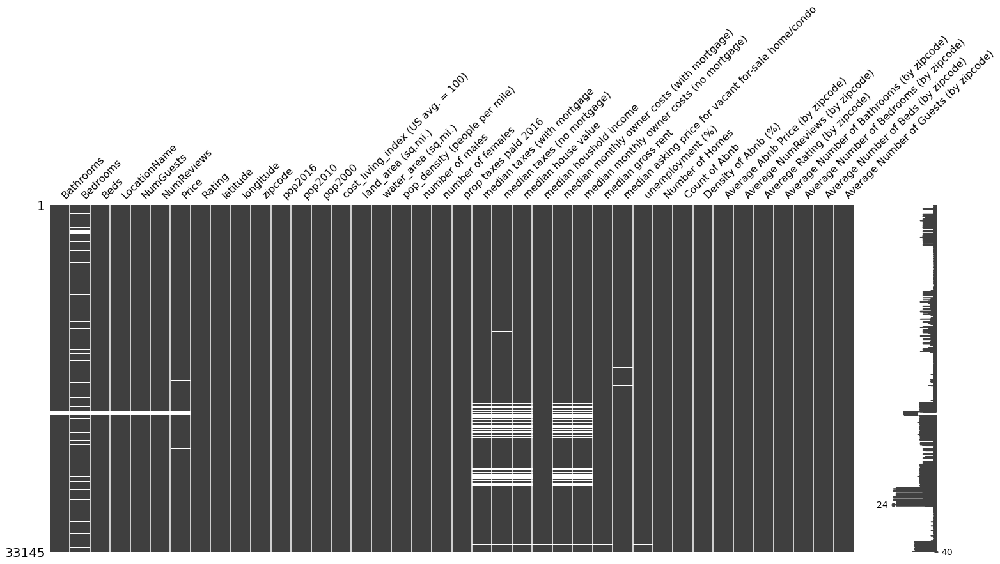

In [ ]:
# visualize missing values as a matrix
msno.matrix(df)

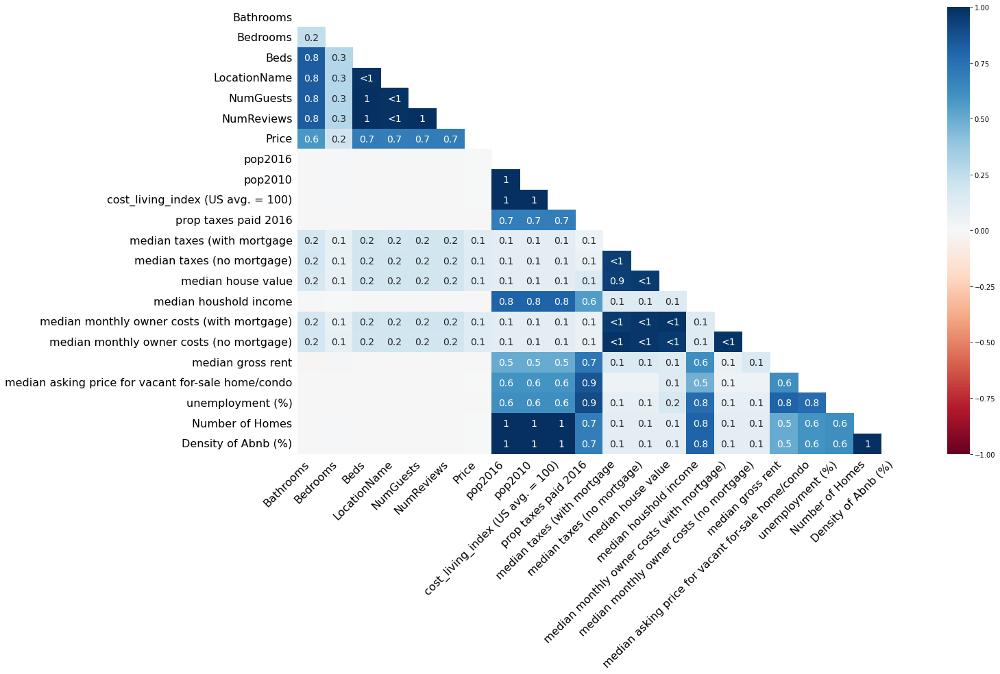

In [ ]:
#heapmap for correlation analysis
msno.heatmap(df)

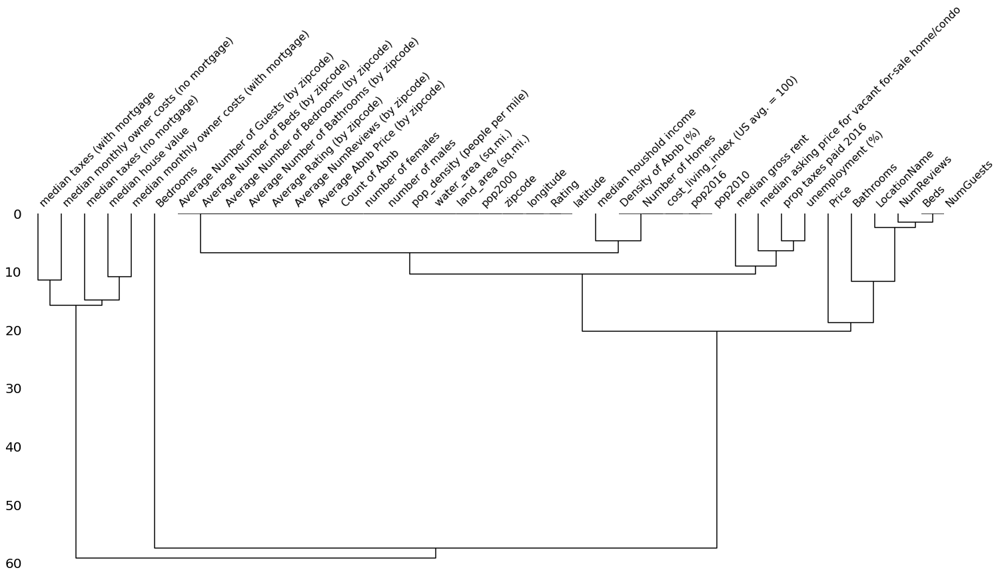

In [ ]:
#dendrogram plot
msno.dendrogram(df)

**Finding:**
  * Bedrooms are MCAR

**Task 5: Handling missing values, Briefely explain your methodology below (within this markdown cell), and write corresponding code in the next code cell.**

In [ ]:
# delete the dublicate rows from the data 
df.drop_duplicates()

,Bathrooms,Bedrooms,Beds,LocationName,NumGuests,NumReviews,Price,Rating,latitude,longitude,...,Number of Homes,Count of Abnb,Density of Abnb (%),Average Abnb Price (by zipcode),Average NumReviews (by zipcode),Average Rating (by zipcode),Average Number of Bathrooms (by zipcode),Average Number of Bedrooms (by zipcode),Average Number of Beds (by zipcode),Average Number of Guests (by zipcode)
0,1.0,1.0,1.0,Atlanta,2.0,7.0,38.0,Y,33.75515,-84.32992,...,5306.0,75,1.413494,104.743243,35.280702,4.944444,1.459459,1.845070,2.146667,2.146667
1,1.0,1.0,1.0,Atlanta,2.0,15.0,38.0,N,33.82613,-84.33963,...,10537.2,96,0.911058,103.673684,21.169231,4.847458,1.281250,1.473118,1.687500,1.687500
2,2.0,2.0,2.0,Atlanta,4.0,17.0,100.0,Y,33.75076,-84.37058,...,9114.4,200,2.194330,119.368687,40.400000,4.937500,1.375000,1.602094,1.925000,1.925000
3,1.0,1.0,1.0,Atlanta,2.0,304.0,78.0,Y,33.77059,-84.33538,...,7808.0,130,1.664959,119.914729,44.063158,4.892857,1.292308,1.603306,1.953846,1.953846
4,1.0,1.0,1.0,Atlanta,2.0,19.0,50.0,Y,33.79030,-84.40027,...,9343.6,190,2.033477,131.058511,28.444444,4.881679,1.326316,1.580838,1.968421,1.968421
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
33140,1.0,1.0,2.0,Washington,5.0,159.0,67.0,N,38.90956,-77.03107,...,5300.0,123,2.320755,135.268293,52.009174,4.800000,1.262295,1.453704,2.203252,2.203252
33141,2.0,1.0,4.0,Washington,1.0,28.0,49.0,Y,38.90920,-77.02622,...,5300.0,123,2.320755,135.268293,52.009174,4.800000,1.262295,1.453704,2.203252,2.203252
33142,1.0,1.0,1.0,Washington,2.0,106.0,120.0,Y,38.88746,-76.99119,...,11794.8,410,3.476108,127.748768,54.344444,4.900289,1.196078,1.442708,2.487805,2.487805
33143,1.0,1.0,2.0,Washington,3.0,296.0,70.0,Y,38.88535,-76.98183,...,11794.8,410,3.476108,127.748768,54.344444,4.900289,1.196078,1.442708,2.487805,2.487805


In [ ]:
# take copy from the data
data = df.copy()

**I will handle the column that its name is `Density of Abnb (%)`**

In [ ]:
# show counts of values in the copy of data
data['Density of Abnb (%)'].value_counts()

330.488194    3167
35.227665     1287
6.511094       749
5.538630       747
11.803456      676
              ... 
0.026916         1
0.007028         1
0.043668         1
0.006278         1
0.010838         1
Name: Density of Abnb (%), Length: 361, dtype: int64

In [ ]:
# get the sum of null value in the orginal data 
df['Density of Abnb (%)'].isna().sum()

42

In [ ]:
# get the sum of null value in the copy of data 
data['Density of Abnb (%)'].isna().sum()

42

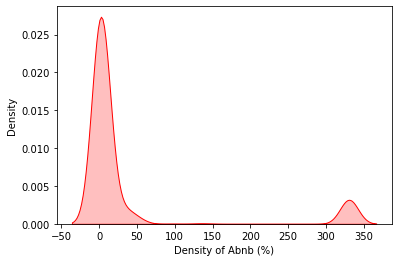

In [ ]:
# Show the distribuation of 'Density of Abnb (%)' from copy of data
ax = sns.kdeplot(data['Density of Abnb (%)'], shade=True, color="r")

In [ ]:
# update all null values with the mean of this column
data['Density of Abnb (%)'] = data['Density of Abnb (%)'].fillna(data['Density of Abnb (%)'].mean())

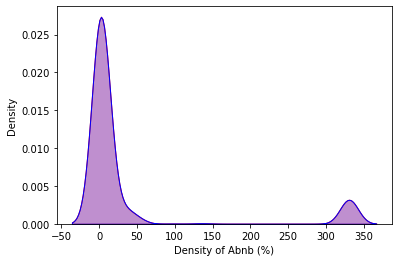

In [ ]:
# Show the distribuation of 'Density of Abnb (%)' from orignal data
ax = sns.kdeplot(df['Density of Abnb (%)'], shade=True, color="r")
# Show the distribuation of 'Density of Abnb (%)' from copy of data
ax = sns.kdeplot(data['Density of Abnb (%)'], shade=True, color="b")

In [ ]:
# get the sum of null value in the copy of data 
data['Density of Abnb (%)'].isna().sum()

0

In [ ]:
# show counts of values in the copy of data
data['Density of Abnb (%)'].value_counts()

330.488194    3167
35.227665     1287
6.511094       749
5.538630       747
11.803456      676
              ... 
0.026916         1
0.003440         1
0.010838         1
0.007028         1
0.057326         1
Name: Density of Abnb (%), Length: 362, dtype: int64

**I will handle the column that its name is `pop2016`**

In [ ]:
# show counts of values in the copy of data
df['pop2016'].value_counts()

3134.0     3167
11596.0    1287
42274.0     749
37419.0     747
26793.0     676
           ... 
18576.0       1
35571.0       1
28625.0       1
39822.0       1
46132.0       1
Name: pop2016, Length: 361, dtype: int64

In [ ]:
# get the sum of null value in the orginal data 
df['pop2016'].isna().sum()

42

In [ ]:
# get the sum of null value in the copy of data 
data['pop2016'].isna().sum()

42

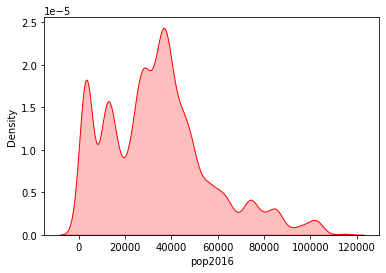

In [ ]:
# Show the distribuation of 'pop2016' from copy of data
ax = sns.kdeplot(df['pop2016'], shade=True, color="r")

In [ ]:
# data['pop2016']=data['pop2016'].fillna(data.groupby('zipcode')['pop2016'].transform(lambda x:x.mode()))
## df[['zipcode', 'pop2016' ]].groupby(['zipcode']).mean()

In [ ]:
# update all null values with the mean of this column
data['pop2016'] = data['pop2016'].fillna(data['pop2016'].mean())

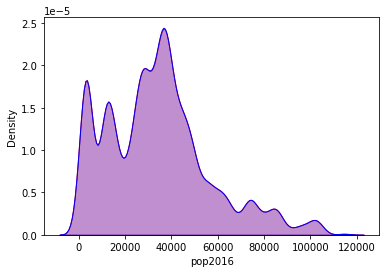

In [ ]:
# Show the distribuation of 'pop2016' from orignal data
ax = sns.kdeplot(df['pop2016'], shade=True, color="r")
# Show the distribuation of 'pop2016' from copy of data
ax = sns.kdeplot(data['pop2016'], shade=True, color="b")

In [ ]:
# get the sum of null value in the copy of data 
data['pop2016'].isna().sum()

0

**I will handle the column that its name is `pop2010`**

In [ ]:
# show counts of values in the copy of data
data['pop2010'].value_counts()

2880.0     3167
11165.0    1287
36228.0     959
40798.0     749
26866.0     676
           ... 
4534.0        1
67813.0       1
34555.0       1
41356.0       1
29595.0       1
Name: pop2010, Length: 358, dtype: int64

In [ ]:
# get the sum of null value in the orginal data 
df['pop2010'].isna().sum()

42

In [ ]:
# get the sum of null value in the copy of data 
data['pop2010'].isna().sum()

42

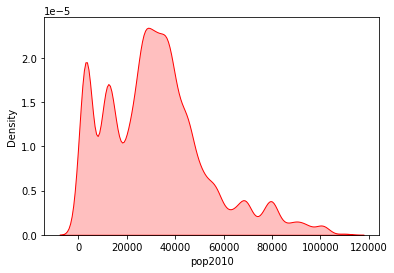

In [ ]:
# Show the distribuation of 'pop2010' from copy of data
ax = sns.kdeplot(data['pop2010'], shade=True, color="r")

In [ ]:
# update all null values with the mean of this column
data['pop2010'] = data['pop2010'].fillna(data['pop2010'].mean())

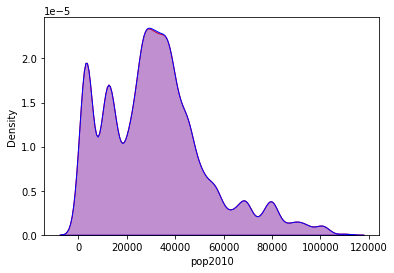

In [ ]:
# Show the distribuation of 'pop2010' from orignal data
ax = sns.kdeplot(df['pop2010'], shade=True, color="r")
# Show the distribuation of 'pop2010' from copy of data
ax = sns.kdeplot(data['pop2010'], shade=True, color="b")

In [ ]:
# get the sum of null value in the copy of data 
data['pop2010'].isna().sum()

0

In [ ]:
# show counts of values in the copy of data
data['pop2010'].value_counts()

2880.0     3167
11165.0    1287
36228.0     959
40798.0     749
26866.0     676
           ... 
41356.0       1
12281.0       1
39150.0       1
67813.0       1
29595.0       1
Name: pop2010, Length: 359, dtype: int64

**I will handle the column that its name is `cost_living_index (US avg. = 100)`**

In [ ]:
# show counts of values in the copy of data
data['cost_living_index (US avg. = 100)'].value_counts()

144.2    3319
114.1    1287
102.7     952
123.8     820
155.2     749
         ... 
137.6       2
103.2       1
151.3       1
157.5       1
137.3       1
Name: cost_living_index (US avg. = 100), Length: 274, dtype: int64

In [ ]:
# get the sum of null value in the orginal data 
df['cost_living_index (US avg. = 100)'].isna().sum()

42

In [ ]:
# get the sum of null value in the copy of data 
data['cost_living_index (US avg. = 100)'].isna().sum()

42

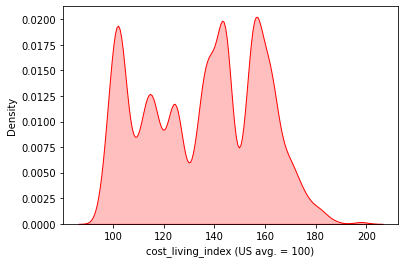

In [ ]:
# Show the distribuation of 'cost_living_index (US avg. = 100)' from copy of data
ax = sns.kdeplot(data['cost_living_index (US avg. = 100)'], shade=True, color="r")

In [ ]:
# update all null values with the mean of this column
data['cost_living_index (US avg. = 100)'] = data['cost_living_index (US avg. = 100)'].fillna(data['cost_living_index (US avg. = 100)'].mean())

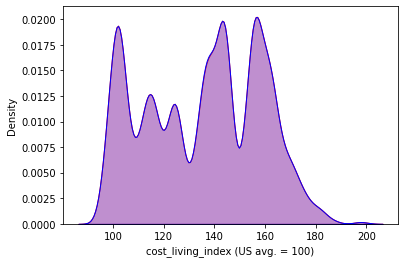

In [ ]:
# Show the distribuation of 'cost_living_index (US avg. = 100)' from orignal data
ax = sns.kdeplot(df['cost_living_index (US avg. = 100)'], shade=True, color="r")
# Show the distribuation of 'Density of Abnb (%)' from copy of data
ax = sns.kdeplot(data['cost_living_index (US avg. = 100)'], shade=True, color="b")

In [ ]:
# get the sum of null value in the copy of data 
data['cost_living_index (US avg. = 100)'].isna().sum()

0

In [ ]:
# show counts of values in the copy of data
data['cost_living_index (US avg. = 100)'].value_counts()

144.2    3319
114.1    1287
102.7     952
123.8     820
155.2     749
         ... 
137.6       2
103.2       1
151.3       1
157.5       1
137.3       1
Name: cost_living_index (US avg. = 100), Length: 275, dtype: int64

**I will handle the column that its name is `Number of Homes`**

In [ ]:
# show counts of values in the copy of data
data['Number of Homes'].value_counts()

1253.6     3167
4638.4     1287
16909.6     749
14967.6     747
10717.2     676
           ... 
7430.4        1
14228.4       1
11450.0       1
15928.8       1
18452.8       1
Name: Number of Homes, Length: 361, dtype: int64

In [ ]:
# get the sum of null value in the orginal data 
df['Number of Homes'].isna().sum()

42

In [ ]:
# get the sum of null value in the copy of data 
data['Number of Homes'].isna().sum()

42

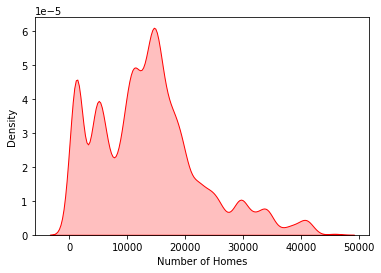

In [ ]:
# Show the distribuation of 'Density of Abnb (%)' from copy of data
ax = sns.kdeplot(data['Number of Homes'], shade=True, color="r")

In [ ]:
# update all null values with the mean of this column
data['Number of Homes'] = data['Number of Homes'].fillna(data['Number of Homes'].mean())

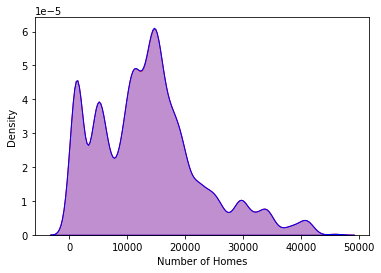

In [ ]:
# Show the distribuation of 'Number of Homes' from orignal data
ax = sns.kdeplot(df['Number of Homes'], shade=True, color="r")
# Show the distribuation of 'Number of Homes' from copy of data
ax = sns.kdeplot(data['Number of Homes'], shade=True, color="b")

In [ ]:
# get the sum of null value in the copy of data 
data['Number of Homes'].isna().sum()

0

In [ ]:
# show counts of values in the copy of data
data['Number of Homes'].value_counts()

1253.6     3167
4638.4     1287
16909.6     749
14967.6     747
10717.2     676
           ... 
7430.4        1
29068.8       1
18452.8       1
14228.4       1
1744.4        1
Name: Number of Homes, Length: 362, dtype: int64

**I will handle the column that its name is `median houshold income`**

In [ ]:
# show counts of values in the copy of data
data['median houshold income'].value_counts()

51315.0     3167
72916.0     1287
69701.0      749
33708.0      747
124468.0     676
            ... 
73329.0        1
95626.0        1
94436.0        1
31215.0        1
27035.0        1
Name: median houshold income, Length: 358, dtype: int64

In [ ]:
# get the sum of null value in the orginal data 
df['median houshold income'].isna().sum()

64

In [ ]:
# get the sum of null value in the copy of data 
data['median houshold income'].isna().sum()

64

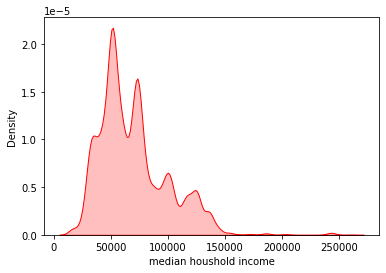

In [ ]:
# Show the distribuation of 'median houshold income' from copy of data
ax = sns.kdeplot(data['median houshold income'], shade=True, color="r")

In [ ]:
# update all null values with the mean of this column
data['median houshold income'] = data['median houshold income'].fillna(data['median houshold income'].mean())

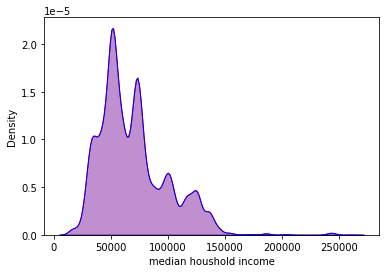

In [ ]:
# Show the distribuation of 'median houshold income' from orignal data
ax = sns.kdeplot(df['median houshold income'], shade=True, color="r")
# Show the distribuation of 'median houshold income' from copy of data
ax = sns.kdeplot(data['median houshold income'], shade=True, color="b")

In [ ]:
# get the sum of null value in the copy of data 
data['median houshold income'].isna().sum()

0

In [ ]:
# show counts of values in the copy of data
data['median houshold income'].value_counts()

51315.0     3167
72916.0     1287
69701.0      749
33708.0      747
124468.0     676
            ... 
28017.0        1
46194.0        1
94436.0        1
27035.0        1
77335.0        1
Name: median houshold income, Length: 359, dtype: int64

**I will handle the column that its name is `prop taxes paid 2016`**

In [ ]:
# show counts of values in the copy of data
data['prop taxes paid 2016'].value_counts()

0.6    10798
0.5     5020
0.8     4736
0.9     4047
0.7     3781
1.1     1632
0.4     1345
1.0      945
1.2      305
0.2      264
0.3      122
1.7       23
1.4       22
1.6       14
1.3        3
2.3        1
Name: prop taxes paid 2016, dtype: int64

In [ ]:
# get the sum of null value in the orginal data 
df['prop taxes paid 2016'].isna().sum()

87

In [ ]:
# get the sum of null value in the copy of data 
data['prop taxes paid 2016'].isna().sum()

87

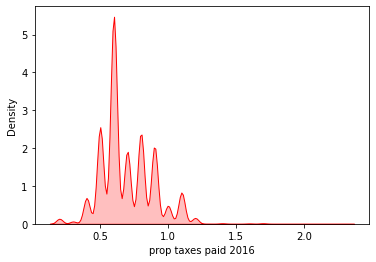

In [ ]:
# Show the distribuation of 'prop taxes paid 2016' from copy of data
ax = sns.kdeplot(data['prop taxes paid 2016'], shade=True, color="r")

In [ ]:
# update all null values with the mean of this column
data['prop taxes paid 2016'] = data['prop taxes paid 2016'].fillna(data['prop taxes paid 2016'].mean())

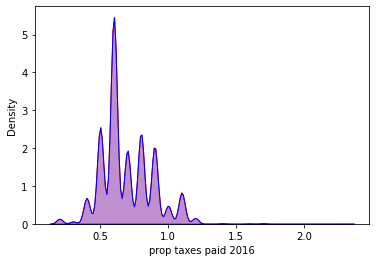

In [ ]:
# Show the distribuation of 'prop taxes paid 2016' from orignal data
ax = sns.kdeplot(df['prop taxes paid 2016'], shade=True, color="r")
# Show the distribuation of 'prop taxes paid 2016' from copy of data
ax = sns.kdeplot(data['prop taxes paid 2016'], shade=True, color="b")

In [ ]:
# get the sum of null value in the copy of data 
data['prop taxes paid 2016'].isna().sum()

0

In [ ]:
# show counts of values in the copy of data
data['prop taxes paid 2016'].value_counts()

0.600000    10798
0.500000     5020
0.800000     4736
0.900000     4047
0.700000     3781
1.100000     1632
0.400000     1345
1.000000      945
1.200000      305
0.200000      264
0.300000      122
0.692683       87
1.700000       23
1.400000       22
1.600000       14
1.300000        3
2.300000        1
Name: prop taxes paid 2016, dtype: int64

**I will handle the column that its name is `unemployment (%)`**

In [ ]:
# show counts of values in the copy of data
data['unemployment (%)'].value_counts()

9.7     3680
3.3     1925
6.8     1805
4.6     1565
4.8     1161
        ... 
13.1       2
10.9       1
8.4        1
13.4       1
8.2        1
Name: unemployment (%), Length: 117, dtype: int64

In [ ]:
# get the sum of null value in the orginal data 
df['unemployment (%)'].isna().sum()

109

In [ ]:
# get the sum of null value in the copy of data 
data['unemployment (%)'].isna().sum()

109

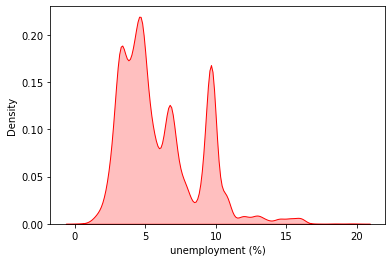

In [ ]:
# Show the distribuation of 'unemployment (%)' from copy of data
ax = sns.kdeplot(data['unemployment (%)'], shade=True, color="r")

In [ ]:
# update all null values with the mean of this column
data['unemployment (%)'] = data['unemployment (%)'].fillna(data['unemployment (%)'].mean())

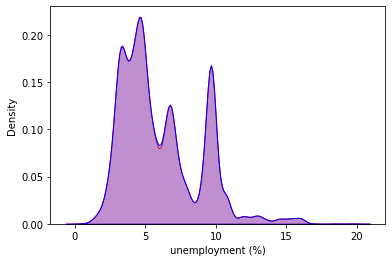

In [ ]:
# Show the distribuation of 'unemployment (%)' from orignal data
ax = sns.kdeplot(df['unemployment (%)'], shade=True, color="r")
# Show the distribuation of 'unemployment (%)' from copy of data
ax = sns.kdeplot(data['unemployment (%)'], shade=True, color="b")

In [ ]:
# get the sum of null value in the copy of data 
data['unemployment (%)'].isna().sum()

0

In [ ]:
# show counts of values in the copy of data
data['unemployment (%)'].value_counts()

9.7     3680
3.3     1925
6.8     1805
4.6     1565
4.8     1161
        ... 
13.1       2
10.9       1
8.4        1
13.4       1
8.2        1
Name: unemployment (%), Length: 118, dtype: int64

**I will handle the column that its name is `median asking price for vacant for-sale home/condo`**

In [ ]:
# show counts of values in the copy of data
data['median asking price for vacant for-sale home/condo'].value_counts()

3898250.0    3694
530742.0     1287
635000.0      749
192284.0      747
685283.0      676
             ... 
726857.0        1
360194.0        1
891811.0        1
430564.0        1
326052.0        1
Name: median asking price for vacant for-sale home/condo, Length: 307, dtype: int64

In [ ]:
# get the sum of null value in the orginal data 
df['median asking price for vacant for-sale home/condo'].isna().sum()

118

In [ ]:
# get the sum of null value in the copy of data 
data['median asking price for vacant for-sale home/condo'].isna().sum()

118

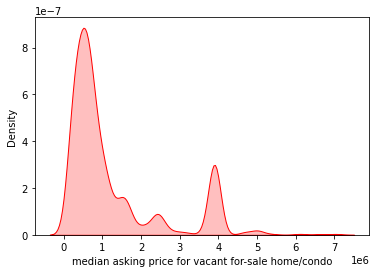

In [ ]:
# Show the distribuation of 'median asking price for vacant for-sale home/condo' from copy of data
ax = sns.kdeplot(data['median asking price for vacant for-sale home/condo'], shade=True, color="r")

In [ ]:
# update all null values with the mean of this column
data['median asking price for vacant for-sale home/condo'] = data['median asking price for vacant for-sale home/condo'].fillna(data['median asking price for vacant for-sale home/condo'].mean())

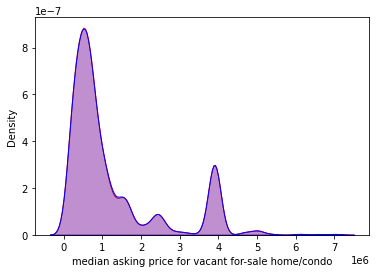

In [ ]:
# Show the distribuation of 'median asking price for vacant for-sale home/condo' from orignal data
ax = sns.kdeplot(df['median asking price for vacant for-sale home/condo'], shade=True, color="r")
# Show the distribuation of 'median asking price for vacant for-sale home/condo' from copy of data
ax = sns.kdeplot(data['median asking price for vacant for-sale home/condo'], shade=True, color="b")

In [ ]:
# get the sum of null value in the copy of data 
data['median asking price for vacant for-sale home/condo'].isna().sum()

0

In [ ]:
# show counts of values in the copy of data
data['median asking price for vacant for-sale home/condo'].value_counts()

3898250.0    3694
530742.0     1287
635000.0      749
192284.0      747
685283.0      676
             ... 
726857.0        1
360194.0        1
891811.0        1
430564.0        1
326052.0        1
Name: median asking price for vacant for-sale home/condo, Length: 308, dtype: int64

**I will handle the column that its name is `median gross rent`**

In [ ]:
# show counts of values in the copy of data
data['median gross rent'].value_counts()

1919.0    3167
1893.0    1287
1437.0     749
986.0      747
1865.0     676
          ... 
1676.0       1
1168.0       1
1678.0       1
1699.0       1
964.0        1
Name: median gross rent, Length: 320, dtype: int64

In [ ]:
# get the sum of null value in the orginal data 
df['median gross rent'].isna().sum()

166

In [ ]:
# get the sum of null value in the copy of data 
data['median gross rent'].isna().sum()

166

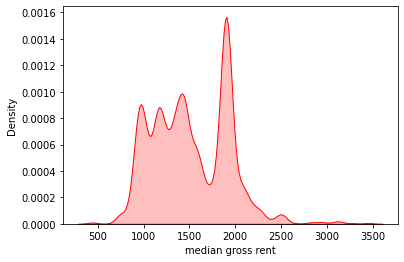

In [ ]:
# Show the distribuation of 'median gross rent' from copy of data
ax = sns.kdeplot(data['median gross rent'], shade=True, color="r")

In [ ]:
# update all null values with the mean of this column
data['median gross rent'] = data['median gross rent'].fillna(data['median gross rent'].mean())

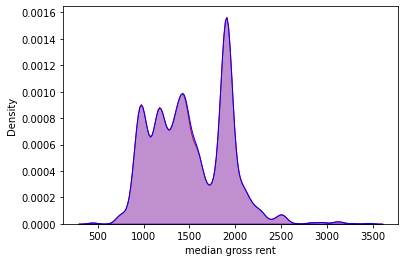

In [ ]:
# Show the distribuation of 'median gross rent' from orignal data
ax = sns.kdeplot(df['median gross rent'], shade=True, color="r")
# Show the distribuation of 'median gross rent' from copy of data
ax = sns.kdeplot(data['median gross rent'], shade=True, color="b")

In [ ]:
# get the sum of null value in the copy of data 
data['median gross rent'].isna().sum()

0

In [ ]:
# show counts of values in the copy of data
data['median gross rent'].value_counts()

1919.0    3167
1893.0    1287
1437.0     749
986.0      747
1865.0     676
          ... 
1007.0       1
1131.0       1
1699.0       1
1293.0       1
1676.0       1
Name: median gross rent, Length: 321, dtype: int64

**I will handle the column that its name is `NumGuests`**

In [ ]:
# show counts of values in the copy of data
data['NumGuests'].value_counts()

2.0     13577
4.0      6415
6.0      3211
3.0      3207
1.0      2246
5.0      1476
8.0      1150
7.0       497
10.0      462
12.0      171
9.0       148
16.0      106
11.0       60
14.0       59
15.0       25
13.0       21
Name: NumGuests, dtype: int64

In [ ]:
# get the sum of null value in the orginal data 
df['NumGuests'].isna().sum()

314

In [ ]:
# get the sum of null value in the copy of data 
data['NumGuests'].isna().sum()

314

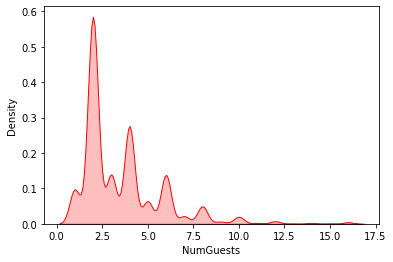

In [ ]:
# Show the distribuation of 'NumGuests' from copy of data
ax = sns.kdeplot(data['NumGuests'], shade=True, color="r")

In [ ]:
# update all null values with the mean of this column
data['NumGuests'] = data['NumGuests'].fillna(data['NumGuests'].mean())

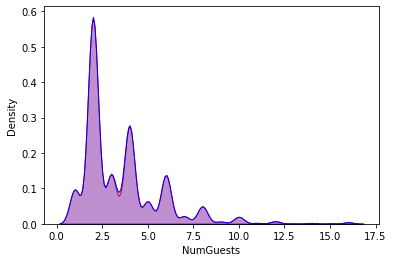

In [ ]:
# Show the distribuation of 'NumGuests' from orignal data
ax = sns.kdeplot(df['NumGuests'], shade=True, color="r")
# Show the distribuation of 'NumGuests' from copy of data
ax = sns.kdeplot(data['NumGuests'], shade=True, color="b")

In [ ]:
# get the sum of null value in the copy of data 
data['NumGuests'].isna().sum()

0

In [ ]:
# show counts of values in the copy of data
data['NumGuests'].value_counts()

2.000000     13577
4.000000      6415
6.000000      3211
3.000000      3207
1.000000      2246
5.000000      1476
8.000000      1150
7.000000       497
10.000000      462
3.528373       314
12.000000      171
9.000000       148
16.000000      106
11.000000       60
14.000000       59
15.000000       25
13.000000       21
Name: NumGuests, dtype: int64

**I will handle the column that its name is `Beds`**

In [ ]:
# show counts of values in the copy of data
data['Beds'].value_counts()

1.0     17108
2.0      8014
3.0      3936
4.0      1936
5.0       844
6.0       432
7.0       224
8.0       131
0.0        64
9.0        42
10.0       40
12.0       22
16.0       14
11.0        8
14.0        6
13.0        6
15.0        3
20.0        1
Name: Beds, dtype: int64

In [ ]:
# get the sum of null value in the orginal data 
df['Beds'].isna().sum()

314

In [ ]:
# get the sum of null value in the copy of data 
data['Beds'].isna().sum()

314

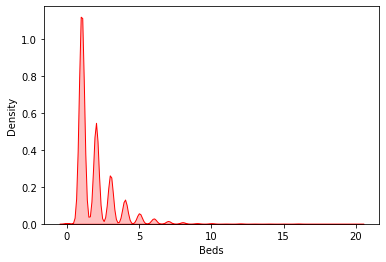

In [ ]:
# Show the distribuation of 'Density of Abnb (%)' from copy of data
ax = sns.kdeplot(data['Beds'], shade=True, color="r")

In [ ]:
# update all null values with the mean of this column
data['Beds'] = data['Beds'].fillna(data['Beds'].mean())

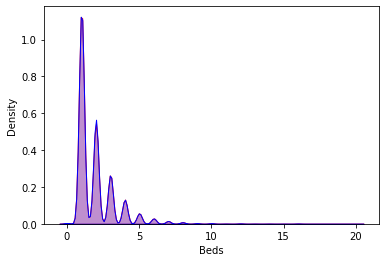

In [ ]:
# Show the distribuation of 'Beds' from orignal data
ax = sns.kdeplot(df['Beds'], shade=True, color="r")
# Show the distribuation of 'Beds' from copy of data
ax = sns.kdeplot(data['Beds'], shade=True, color="b")

In [ ]:
# get the sum of null value in the copy of data 
data['Beds'].isna().sum()

0

In [ ]:
# show counts of values in the copy of data
data['Beds'].value_counts()

1.000000     17108
2.000000      8014
3.000000      3936
4.000000      1936
5.000000       844
6.000000       432
1.940148       314
7.000000       224
8.000000       131
0.000000        64
9.000000        42
10.000000       40
12.000000       22
16.000000       14
11.000000        8
13.000000        6
14.000000        6
15.000000        3
20.000000        1
Name: Beds, dtype: int64

**I will handle the column that its name is `NumReviews`**

In [ ]:
# show counts of values in the copy of data
data['NumReviews'].value_counts()

3.0      1403
4.0      1236
5.0      1069
6.0      1009
7.0       893
         ... 
603.0       1
349.0       1
325.0       1
617.0       1
348.0       1
Name: NumReviews, Length: 432, dtype: int64

In [ ]:
# get the sum of null value in the orginal data 
df['NumReviews'].isna().sum()

316

In [ ]:
# get the sum of null value in the copy of data 
data['NumReviews'].isna().sum()

316

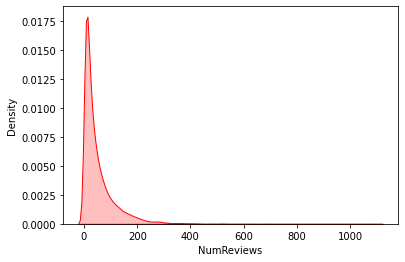

In [ ]:
# Show the distribuation of 'NumReviews' from copy of data
ax = sns.kdeplot(data['NumReviews'], shade=True, color="r")

In [ ]:
# update all null values with the mean of this column
data['NumReviews'] = data['NumReviews'].fillna(data['NumReviews'].mean())

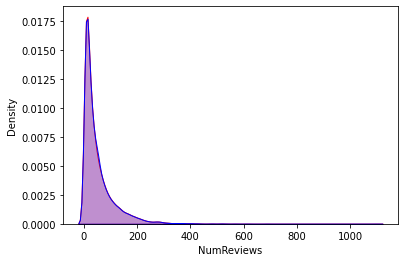

In [ ]:
# Show the distribuation of 'NumReviews' from orignal data
ax = sns.kdeplot(df['NumReviews'], shade=True, color="r")
# Show the distribuation of 'NumReviews' from copy of data
ax = sns.kdeplot(data['NumReviews'], shade=True, color="b")

In [ ]:
# get the sum of null value in the copy of data 
data['NumReviews'].isna().sum()

0

In [ ]:
# show counts of values in the copy of data
data['NumReviews'].value_counts()

3.0      1403
4.0      1236
5.0      1069
6.0      1009
7.0       893
         ... 
349.0       1
325.0       1
617.0       1
448.0       1
348.0       1
Name: NumReviews, Length: 433, dtype: int64

**I will handle the column that its name is `LocationName`**

In [ ]:
# show counts of values in the copy of data
data['LocationName'].value_counts()

San Diego               4462
New Orleans             4129
San Francisco           3725
Brooklyn                2244
New York                2178
                        ... 
Astoria New York           1
Astoria,New York           1
Saint Albans               1
Astoria, Queens            1
Suitland-Silver Hill       1
Name: LocationName, Length: 276, dtype: int64

In [ ]:
# get the sum of null value in the orginal data 
df['LocationName'].isna().sum()

319

In [ ]:
# # get the sum of null value in the copy of data 
# data.drop('LocationName', inplace=True, axis=1)

In [ ]:
data['LocationName'].unique()

array(['Atlanta', 'Decatur', 'Atlanta#3', 'East Point', 'Stone Mountain',
       'Atlanta, Georgia, US', 'Midtown, Atlanta', 'Boston', 'Newton',
       'Brookline', 'Chelsea', 'Cambridge', 'Roslindale', 'Dorchester',
       'Milton', 'MA', 'West Roxbury', 'Brighton', 'Chestnut Hill',
       'Winthrop', 'Watertown', 'Dedham', 'Mattapan', 'Hyde Park',
       'Waltham', 'Newtonville', 'Wellesley', 'Revere',
       'Roxbury Crossing', 'Framingham', 'Dorchester Center',
       'Roslindale, Boston', 'Miami', 'Sunny Isles Beach', 'Homestead',
       'Coral Gables', 'North Bay Village', 'Hialeah', 'Miami Springs',
       'Key Biscayne', 'Cutler Bay', 'Miami Beach', 'Aventura',
       'Hollywood', 'North Miami Beach', 'North Miami', 'Hialeah Gardens',
       'North Bay Village Miami', 'Palmetto Bay', 'El Portal',
       'Hallandale Beach', 'Florida City', 'Sunny isles beach',
       'Brickell, Miami ', 'Virginia Gardens', 'SUNNY ISLES',
       'Pembroke Pines', 'Fountainebleau', 'US', 'West Mia

In [ ]:
fre = data['LocationName'].mode()[0]
fre

'San Diego'

In [ ]:
data.LocationName = data.LocationName.replace(to_replace = ['_________', '____________', '11220'], value=fre)

In [ ]:
data['LocationName'].unique()

array(['Atlanta', 'Decatur', 'Atlanta#3', 'East Point', 'Stone Mountain',
       'Atlanta, Georgia, US', 'Midtown, Atlanta', 'Boston', 'Newton',
       'Brookline', 'Chelsea', 'Cambridge', 'Roslindale', 'Dorchester',
       'Milton', 'MA', 'West Roxbury', 'Brighton', 'Chestnut Hill',
       'Winthrop', 'Watertown', 'Dedham', 'Mattapan', 'Hyde Park',
       'Waltham', 'Newtonville', 'Wellesley', 'Revere',
       'Roxbury Crossing', 'Framingham', 'Dorchester Center',
       'Roslindale, Boston', 'Miami', 'Sunny Isles Beach', 'Homestead',
       'Coral Gables', 'North Bay Village', 'Hialeah', 'Miami Springs',
       'Key Biscayne', 'Cutler Bay', 'Miami Beach', 'Aventura',
       'Hollywood', 'North Miami Beach', 'North Miami', 'Hialeah Gardens',
       'North Bay Village Miami', 'Palmetto Bay', 'El Portal',
       'Hallandale Beach', 'Florida City', 'Sunny isles beach',
       'Brickell, Miami ', 'Virginia Gardens', 'SUNNY ISLES',
       'Pembroke Pines', 'Fountainebleau', 'US', 'West Mia

In [ ]:
# update all null values with the mean of this column
data['LocationName'] = data['LocationName'].fillna(fre)

In [ ]:
# get the sum of null value in the copy of data 
data['LocationName'].isna().sum()

0

In [ ]:
# show counts of values in the copy of data
data['LocationName'].value_counts()

San Diego                      4789
New Orleans                    4129
San Francisco                  3725
Brooklyn                       2244
New York                       2178
                               ... 
Flushing /Kew Gardens Hills       1
Nyc                               1
Middle Village                    1
Bellerose                         1
Suitland-Silver Hill              1
Name: LocationName, Length: 273, dtype: int64

**I will handle the column that its name is `Bathrooms`**

In [ ]:
# show counts of values in the copy of data
data['Bathrooms'].value_counts()

1.0    26736
2.0     4859
3.0      735
4.0      172
0.0      127
5.0       42
8.0       18
7.0        4
6.0        3
9.0        1
Name: Bathrooms, dtype: int64

In [ ]:
# get the sum of null value in the orginal data 
df['Bathrooms'].isna().sum()

448

In [ ]:
# get the sum of null value in the copy of data 
data['Bathrooms'].isna().sum()

448

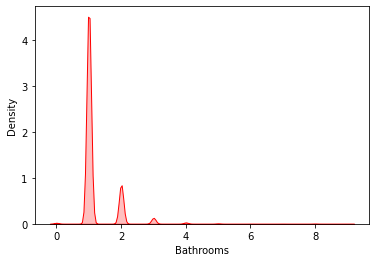

In [ ]:
# Show the distribuation of 'Density of Abnb (%)' from copy of data
ax = sns.kdeplot(data['Bathrooms'], shade=True, color="r")

In [ ]:
# update all null values with the mean of this column
data['Bathrooms'] = data['Bathrooms'].fillna(data['Bathrooms'].mean())

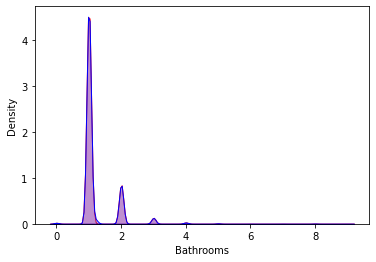

In [ ]:
# Show the distribuation of 'Bathrooms' from orignal data
ax = sns.kdeplot(df['Bathrooms'], shade=True, color="r")
# Show the distribuation of 'Bathrooms' from copy of data
ax = sns.kdeplot(data['Bathrooms'], shade=True, color="b")

In [ ]:
# get the sum of null value in the copy of data 
data['Bathrooms'].isna().sum()

0

In [ ]:
# show counts of values in the copy of data
data['Bathrooms'].value_counts()

1.000000    26736
2.000000     4859
3.000000      735
1.215891      448
4.000000      172
0.000000      127
5.000000       42
8.000000       18
7.000000        4
6.000000        3
9.000000        1
Name: Bathrooms, dtype: int64

**I will handle the column that its name is `Price`**

In [ ]:
# show counts of values in the copy of data
data['Price'].value_counts()

75.0     981
99.0     893
100.0    821
50.0     808
65.0     796
        ... 
875.0      1
346.0      1
11.0       1
416.0      1
401.0      1
Name: Price, Length: 504, dtype: int64

In [ ]:
# get the sum of null value in the orginal data 
df['Price'].isna().sum()

638

In [ ]:
# get the sum of null value in the copy of data 
data['Price'].isna().sum()

638

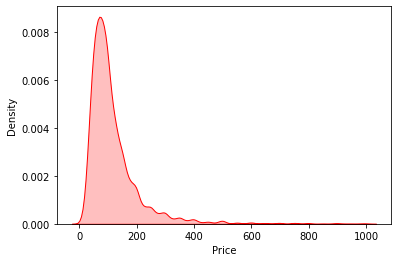

In [ ]:
# Show the distribuation of 'Price' from copy of data
ax = sns.kdeplot(data['Price'], shade=True, color="r")

In [ ]:
# update all null values with the mean of this column
data['Price'] = data['Price'].fillna(data['Price'].mean())

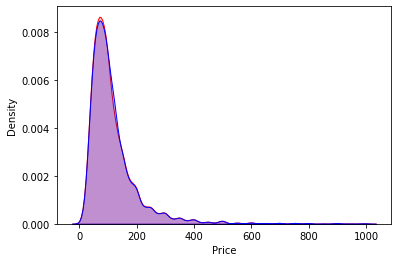

In [ ]:
# Show the distribuation of 'Price' from orignal data
ax = sns.kdeplot(df['Price'], shade=True, color="r")
# Show the distribuation of 'Price' from copy of data
ax = sns.kdeplot(data['Price'], shade=True, color="b")

In [ ]:
# get the sum of null value in the copy of data 
data['Price'].isna().sum()

0

In [ ]:
# show counts of values in the copy of data
data['Price'].value_counts()

75.0     981
99.0     893
100.0    821
50.0     808
65.0     796
        ... 
257.0      1
424.0      1
453.0      1
367.0      1
401.0      1
Name: Price, Length: 505, dtype: int64

**I will handle the column that its name is `Bedrooms`**

In [ ]:
# show counts of values in the copy of data
data['Bedrooms'].value_counts()

1.0     20507
2.0      5881
3.0      2399
4.0       759
5.0       201
6.0        51
7.0        13
8.0         3
9.0         2
10.0        2
Name: Bedrooms, dtype: int64

In [ ]:
# get the sum of null value in the orginal data 
df['Bedrooms'].isna().sum()

3327

In [ ]:
# get the sum of null value in the copy of data 
data['Bedrooms'].isna().sum()

3327

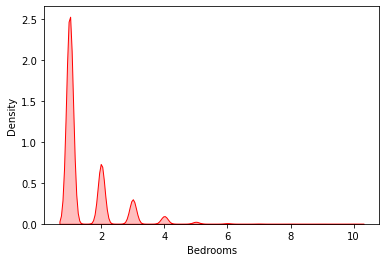

In [ ]:
# Show the distribuation of 'Bedrooms' from copy of data
ax = sns.kdeplot(data['Bedrooms'], shade=True, color="r")

In [ ]:
# update all null values with the mode (the most frequance) of this column
data['Bedrooms'] = data['Bedrooms'].fillna(data['Bedrooms'].mode()[0])

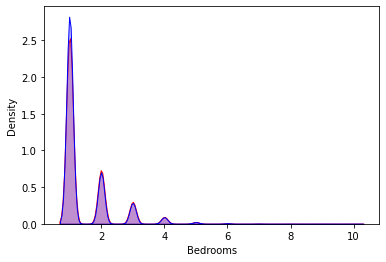

In [ ]:
# Show the distribuation of 'Bedrooms' from orignal data
ax = sns.kdeplot(df['Bedrooms'], shade=True, color="r")
# Show the distribuation of 'Bedrooms' from copy of data
ax = sns.kdeplot(data['Bedrooms'], shade=True, color="b")

In [ ]:
# get the sum of null value in the copy of data 
data['Bedrooms'].isna().sum()

0

In [ ]:
# show counts of values in the copy of data
data['Bedrooms'].value_counts()

1.0     23834
2.0      5881
3.0      2399
4.0       759
5.0       201
6.0        51
7.0        13
8.0         3
9.0         2
10.0        2
Name: Bedrooms, dtype: int64

**I will handle the column that its name is `median house value`**

In [ ]:
# show counts of values in the copy of data
data['median house value'].value_counts()

481478.0     1287
693470.0      749
244735.0      747
1011681.0     676
276478.0      638
             ... 
441743.0        1
88016.0         1
530203.0        1
409112.0        1
563389.0        1
Name: median house value, Length: 345, dtype: int64

In [ ]:
# get the sum of null value in the orginal data 
df['median house value'].isna().sum()

3333

In [ ]:
# get the sum of null value in the copy of data 
data['median house value'].isna().sum()

3333

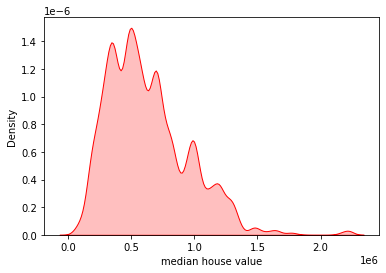

In [ ]:
# Show the distribuation of 'median house value' from copy of data
ax = sns.kdeplot(data['median house value'], shade=True, color="r")

In [ ]:
# update all null values with the mean of this column
data['median house value'] = data['median house value'].fillna(data['median house value'].mean())

In [ ]:
# data['median house value'] = data['median house value'].fillna(data['median house value'].mode()[0])

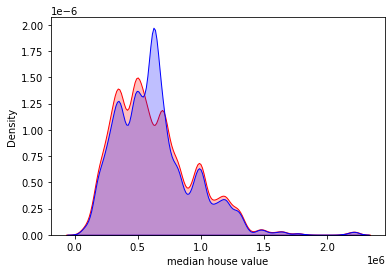

In [ ]:
# Show the distribuation of 'median house value' from orignal data
ax = sns.kdeplot(df['median house value'], shade=True, color="r")
# Show the distribuation of 'median house value' from copy of data
ax = sns.kdeplot(data['median house value'], shade=True, color="b")

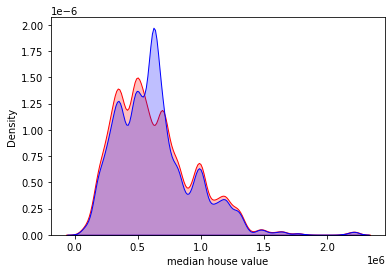

In [ ]:
# Show the distribuation of 'median house value' from orignal data
ax = sns.kdeplot(df['median house value'], shade=True, color="r")
# Show the distribuation of 'median house value' from copy of data
ax = sns.kdeplot(data['median house value'], shade=True, color="b")

In [ ]:
# get the sum of null value in the copy of data 
data['Density of Abnb (%)'].isna().sum()

0

In [ ]:
# show counts of values in the copy of data
data['Density of Abnb (%)'].value_counts()

330.488194    3167
35.227665     1287
6.511094       749
5.538630       747
11.803456      676
              ... 
0.026916         1
0.003440         1
0.010838         1
0.007028         1
0.057326         1
Name: Density of Abnb (%), Length: 362, dtype: int64

**I will handle the column that its name is `median monthly owner costs (with mortgage)`**

In [ ]:
# show counts of values in the copy of data
data['median monthly owner costs (with mortgage)'].value_counts()

2660.0    1287
2553.0     749
1588.0     747
3410.0     676
3987.0     666
          ... 
2682.0       1
2588.0       1
933.0        1
2650.0       1
2868.0       1
Name: median monthly owner costs (with mortgage), Length: 322, dtype: int64

In [ ]:
# get the sum of null value in the orginal data 
df['median monthly owner costs (with mortgage)'].isna().sum()

3361

In [ ]:
# get the sum of null value in the copy of data 
data['median monthly owner costs (with mortgage)'].isna().sum()

3361

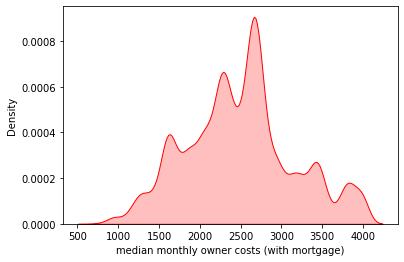

In [ ]:
# Show the distribuation of 'Density of Abnb (%)' from copy of data
ax = sns.kdeplot(data['median monthly owner costs (with mortgage)'], shade=True, color="r")

In [ ]:
# update all null values with the mode (the most frequance) of this column
data['median monthly owner costs (with mortgage)'] = data['median monthly owner costs (with mortgage)'].fillna(data['median monthly owner costs (with mortgage)'].mode()[0])

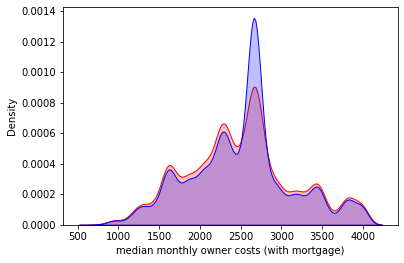

In [ ]:
# Show the distribuation of 'median monthly owner costs (with mortgage)' from orignal data
ax = sns.kdeplot(df['median monthly owner costs (with mortgage)'], shade=True, color="r")
# Show the distribuation of 'median monthly owner costs (with mortgage)' from copy of data
ax = sns.kdeplot(data['median monthly owner costs (with mortgage)'], shade=True, color="b")

In [ ]:
# get the sum of null value in the copy of data 
data['Density of Abnb (%)'].isna().sum()

0

In [ ]:
# show counts of values in the copy of data
data['Density of Abnb (%)'].value_counts()

330.488194    3167
35.227665     1287
6.511094       749
5.538630       747
11.803456      676
              ... 
0.026916         1
0.003440         1
0.010838         1
0.007028         1
0.057326         1
Name: Density of Abnb (%), Length: 362, dtype: int64

**I will handle the column that its name is `median monthly owner costs (no mortgage)`**

In [ ]:
# show counts of values in the copy of data
data['median monthly owner costs (no mortgage)'].value_counts()

1259.0    1287
415.0      911
442.0      747
554.0      700
1257.0     676
          ... 
1082.0       1
904.0        1
971.0        1
798.0        1
989.0        1
Name: median monthly owner costs (no mortgage), Length: 271, dtype: int64

In [ ]:
# get the sum of null value in the orginal data 
df['median monthly owner costs (no mortgage)'].isna().sum()

3494

In [ ]:
# get the sum of null value in the copy of data 
data['median monthly owner costs (no mortgage)'].isna().sum()

3494

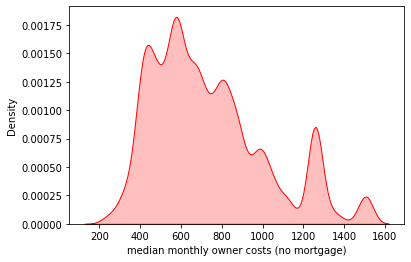

In [ ]:
# Show the distribuation of 'median monthly owner costs (no mortgage)' from copy of data
ax = sns.kdeplot(data['median monthly owner costs (no mortgage)'], shade=True, color="r")

In [ ]:
# update all null values with the mode (the most frequance) of this column
data['median monthly owner costs (no mortgage)'] = data['median monthly owner costs (no mortgage)'].fillna(data['median monthly owner costs (no mortgage)'].mode()[0])

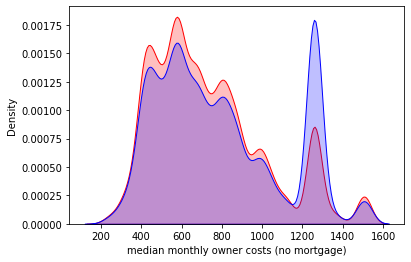

In [ ]:
# Show the distribuation of 'median monthly owner costs (no mortgage)' from orignal data
ax = sns.kdeplot(df['median monthly owner costs (no mortgage)'], shade=True, color="r")
# Show the distribuation of 'median monthly owner costs (no mortgage)' from copy of data
ax = sns.kdeplot(data['median monthly owner costs (no mortgage)'], shade=True, color="b")

In [ ]:
# get the sum of null value in the copy of data 
data['median monthly owner costs (no mortgage)'].isna().sum()

0

In [ ]:
# show counts of values in the copy of data
data['median monthly owner costs (no mortgage)'].value_counts()

1259.0    4781
415.0      911
442.0      747
554.0      700
1257.0     676
          ... 
1082.0       1
904.0        1
971.0        1
798.0        1
989.0        1
Name: median monthly owner costs (no mortgage), Length: 271, dtype: int64

**I will handle the column that its name is `median taxes (no mortgage)`**

In [ ]:
# show counts of values in the copy of data
data['median taxes (no mortgage)'].value_counts()

5435.0    1287
1813.0     749
1139.0     747
7121.0     676
2041.0     638
          ... 
4790.0       1
5307.0       1
5542.0       1
957.0        1
3861.0       1
Name: median taxes (no mortgage), Length: 325, dtype: int64

In [ ]:
# get the sum of null value in the orginal data 
df['median taxes (no mortgage)'].isna().sum()

3527

In [ ]:
# get the sum of null value in the copy of data 
data['median taxes (no mortgage)'].isna().sum()

3527

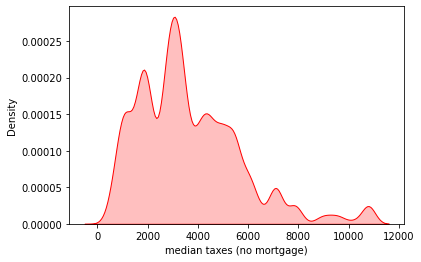

In [ ]:
# Show the distribuation of 'median taxes (no mortgage)' from copy of data
ax = sns.kdeplot(data['median taxes (no mortgage)'], shade=True, color="r")

In [ ]:
# update all null values with the mode (the most frequance) of this column
data['median taxes (no mortgage)'] = data['median taxes (no mortgage)'].fillna(data['median taxes (no mortgage)'].mode()[0])

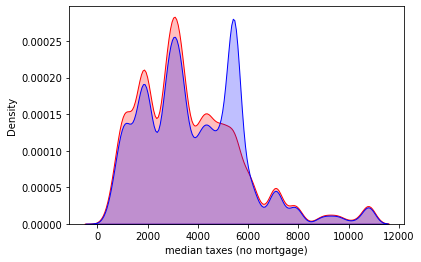

In [ ]:
# Show the distribuation of 'median taxes (no mortgage)' from orignal data
ax = sns.kdeplot(df['median taxes (no mortgage)'], shade=True, color="r")
# Show the distribuation of 'Density of Abnb (%)' from copy of data
ax = sns.kdeplot(data['median taxes (no mortgage)'], shade=True, color="b")

In [ ]:
# get the sum of null value in the copy of data 
data['median taxes (no mortgage)'].isna().sum()

0

In [ ]:
# show counts of values in the copy of data
data['median taxes (no mortgage)'].value_counts()

5435.0    4814
1813.0     749
1139.0     747
7121.0     676
2041.0     638
          ... 
4790.0       1
5307.0       1
5542.0       1
957.0        1
3861.0       1
Name: median taxes (no mortgage), Length: 325, dtype: int64

**I will handle the column that its name is `median taxes (with mortgage`**

In [ ]:
# show counts of values in the copy of data
data['median taxes (with mortgage'].value_counts()

4922.0    1287
5453.0     749
1778.0     747
6618.0     676
2543.0     638
          ... 
3697.0       1
4821.0       1
2665.0       1
5884.0       1
1066.0       1
Name: median taxes (with mortgage, Length: 323, dtype: int64

In [ ]:
# get the sum of null value in the orginal data 
df['median taxes (with mortgage'].isna().sum()

3621

In [ ]:
# get the sum of null value in the copy of data 
data['median taxes (with mortgage'].isna().sum()

3621

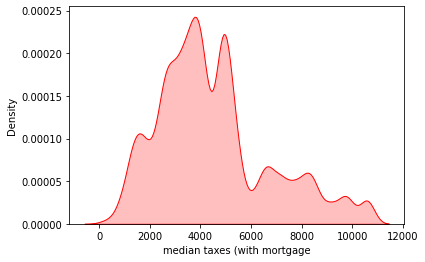

In [ ]:
# Show the distribuation of 'median taxes (with mortgage' from copy of data
ax = sns.kdeplot(data['median taxes (with mortgage'], shade=True, color="r")

In [ ]:
# update all null values with the mode (the most frequance) of this column
data['median taxes (with mortgage'] = data['median taxes (with mortgage'].fillna(data['median taxes (with mortgage'].mode()[0])

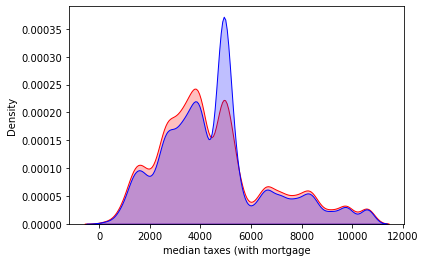

In [ ]:
# Show the distribuation of 'median taxes (with mortgage' from orignal data
ax = sns.kdeplot(df['median taxes (with mortgage'], shade=True, color="r")
# Show the distribuation of 'median taxes (with mortgage' from copy of data
ax = sns.kdeplot(data['median taxes (with mortgage'], shade=True, color="b")

In [ ]:
# get the sum of null value in the copy of data 
data['median taxes (with mortgage'].isna().sum()

0

In [ ]:
# show counts of values in the copy of data
data['median taxes (with mortgage'].value_counts()

4922.0    4908
5453.0     749
1778.0     747
6618.0     676
2543.0     638
          ... 
3697.0       1
4821.0       1
2665.0       1
5884.0       1
1066.0       1
Name: median taxes (with mortgage, Length: 323, dtype: int64

In [ ]:
# you can also count the ratio of missing values
total_miss = data.isnull().sum()
percent_miss = (total_miss/data.isnull().count()*100)

# sort attributes by missing value ratio
missing_data = pd.DataFrame({'Total missing':total_miss,'missing %':percent_miss})
missing_data.sort_values(by='Total missing',ascending=False)

,Total missing,missing %
Bathrooms,0,0.0
Bedrooms,0,0.0
median taxes (no mortgage),0,0.0
median house value,0,0.0
median houshold income,0,0.0
median monthly owner costs (with mortgage),0,0.0
median monthly owner costs (no mortgage),0,0.0
median gross rent,0,0.0
median asking price for vacant for-sale home/condo,0,0.0
unemployment (%),0,0.0


**Task 6: Impact on classification performance. Consider one of the above handling method you proposed for this dataset and perform classification tast to investigate if your handling method can improve classificaiton performance.**

**Train-test split: you can do one split of train and test where 70% of the data for training and the remaining 30% for testing. 
Classifier: you can pick any two tranditional binary classifier (e.g., from sklearn)**

In [ ]:
# plt.pie(label["label"], labels=label.index ,autopct='%1.1f%%'); 
# plt.show()

In [ ]:
# Convert Categorical values to numerical values
encoder = LabelEncoder()
data['Rating']= encoder.fit_transform(data['Rating'])
data['LocationName']= encoder.fit_transform(data['LocationName'])

In [ ]:
# Split the data To X (The Features) and y(The label)
X= data.drop('Rating',1)
y= data["Rating"]

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only
  


In [ ]:
# Split the X and y to X_train, X_test, y_train and y_test
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

**XGBoost**

\

This algorithm goes by lots of different names such as gradient boosting, multiple additive regression trees, stochastic gradient boosting or gradient boosting machines.

A Gradient Boosting Decision Trees (GBDT) is a decision tree ensemble learning algorithm similar to random forest, **Ensemble learning algorithms** combine multiple machine learning algorithms to obtain a better model. **Random forest** uses to build full decision trees in parallel from random bootstrap samples of the data set. 

It is the top machine learning library for regression, classification, and ranking tasks.

* It includes parallel tree boosting.
* It supports regularization.
* It is designed to handle missing data with its in-build features.
* The user can run a cross-validation after each iteration. 
* It works well in small to medium dataset.
* It is designed to be highly efficient, flexible and portable.
* It has a distributed weighted quantile sketch algorithm to effectively handle weighted data.

In [ ]:
xgb_model = XGBClassifier(objective="binary:logistic", random_state=42)
xgb_model.fit(X_train, y_train)

XGBClassifier(random_state=42)

In [ ]:
y_pred = xgb_model.predict(X_test)

In [ ]:
ma_lr = xgb_model.score(X_test,y_test)
print('XGBClassifier Accuracy: ',ma_lr)

XGBClassifier Accuracy:  0.709070796460177


In [ ]:
# ma_lr = xgb_model.score(X_test,y_test)
# print('XGBClassifier Accuracy: ',ma_lr)

**Random Forest**
Random forests are a type of ensemble method. An ensemble method is a process in which numerous models are fitted and the results are combined for stronger predictions. While this provides great predictions, inference and explainability are often limited. Random forests are composed of a number of decision trees where the included predictors are chosen at random. The name comes from randomly building trees to make a forest.

We can create a random forest just like we created a decision tree, except now we are also specifying parameters that indicate how many trees should be in the forest, how we should subset the data items (the rows), and how we should subset the fields (the columns).

In the following function definition, `n_estimators` defines the number of trees we want,` max_samples` defines how many rows to sample for training each tree, and `max_features` defines how many columns to sample at each split point (where 0.5 means “take half the total number of columns”). We can also specify when to stop splitting the tree nodes, effectively limiting the depth of the tree, by including the same `min_samples_leaf` parameter we used in the preceding section. Finally, we pass `n_jobs=-1` to tell sklearn to use all our CPUs to build the trees in parallel.

In [ ]:
clf = RandomForestClassifier()

In [ ]:
clf.fit(X_train, y_train)

RandomForestClassifier()

In [ ]:
y_pred = clf.predict(X_test)

In [ ]:
ma_lr = xgb_model.score(X_test,y_test)
print('RandomForestClassifier Accuracy: ',ma_lr)

RandomForestClassifier Accuracy:  0.709070796460177


**Logistic Regression**

Logistic regression is used to handle the classification problems.

It is used in statistical software to understand the relationship between the dependent variable and one or more independent variables by estimating probabilities using a logistic regression equation.  

It is often used for predictive analytics and modeling, and extends to applications in machine learning. Logistic regression is easier to implement, interpret, and very efficient to train. 

\

**There are three main types of logistic regression:**
 * **Binary regression** deals with two possible values, essentially: yes or no. 
 * **Multinomial logistic regression** deals with three or more values.
 * **ordinal logistic regression** deals with three or more classes in a predetermined order. 

In [ ]:
model_rl = LogisticRegression(random_state=0)

In [ ]:
model_rl.fit(X_train, y_train)

/usr/local/lib/python3.7/dist-packages/sklearn/linear_model/_logistic.py:818: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG,


LogisticRegression(random_state=0)

In [ ]:
y_pred = model_rl.predict(X_test)

In [ ]:
ma_lr = model_rl.score(X_test,y_test)
print('RandomForestClassifier Accuracy: ',ma_lr)

RandomForestClassifier Accuracy:  0.6864440868865648


**Decision Tree**

In [ ]:
clf = tree.DecisionTreeClassifier()

In [ ]:
clf = clf.fit(X_train, y_train)

In [ ]:
y_pred = clf.predict(X_test)

In [ ]:
ma_lr = clf.score(X_test,y_test)
print('RandomForestClassifier Accuracy: ',ma_lr)

RandomForestClassifier Accuracy:  0.6889581657280772


**Task 7: Report your findings through the above experiments (in this markdown cell)**

**The Report:**
  * load data and read it from sdf files data
    * **Finding:**
      * the dimention of data is 33145 rows and 40 Columns
      * the data type is 32 columns are  float64, 6 columns are int64 and 2 columns are object.
      * Show the column's names. 
      * get the describtion of the data such as Count, mean, standard deviation, minimume and maximune values.
      * Display some of the data in the graphs, bar char and distribution.
      * The data has duplicate values. it has 4254 rows which is duplicate.
      * The data has missing values in the data. there are missing values in 21 columns.
      * The missing values exist in median taxes (with mortgage , median taxes (no mortgage), median monthly owner costs (no mortgage), median monthly owner costs (with mortgage), median house value, Bedrooms, Price, Bathrooms, LocationName, NumReviews, Beds, NumGuests, median gross rent, median asking price for vacant for-sale home/condo, unemployment (%), prop taxes paid 2016, median houshold income, Number of Homes, cost_living_index (US avg. = 100), pop2010, pop2016 and Density of Abnb (%).
      * The columns have the total count of missing values and the percentage it: 
          *  median taxes (with mortgage: the total count is	3621 and the percentage is	10.924725.
          * median taxes (no mortgage):	the total count is	3527	and the percentage is	10.641122.
          * median monthly owner costs (no mortgage):	the total count is 3494	and the percentage is 10.541560.
          * median monthly owner costs (with mortgage):	the total count is 3361	and the percentage is 10.140293.
          * median house value:	the total count is 3333	and the percentage is	10.055815.
          * Bedrooms:	the total count is 3327	and the percentage is	10.037713.
          * Price:	the total count is 	638	and the percentage is	1.924876.
          * Bathrooms:	the total count is 	448	and the percentage is	1.351637.
          * LocationName:	the total count is 	319	and the percentage is	0.962438.
          * NumReviews:	the total count is 	316	and the percentage is	0.953387.
          * Beds:	the total count is 	314	and the percentage is	0.947353.
          * NumGuests:	the total count is 	314	and the percentage is	0.947353.
          * median gross rent:	the total count is 	166	and the percentage is	0.500830.
          * median asking price for vacant for-sale home/condo:	the total count is 	118	and the percentage is	0.356011.
          * unemployment (%):	the total count is 	109	and the percentage is	0.328858.
          * prop taxes paid 2016:	the total count is 	87 and the percentage is 0.262483.
          * median houshold income:	the total count is 	64	and the percentage is	0.193091.
          * Number of Homes:	the total count is 	42	and the percentage is	0.126716.
          * cost_living_index (US avg. = 100):	the total count is 	42	and the percentage is	0.126716.
          * pop2010:	the total count is 	42	and the percentage is	0.126716.
          * pop2016:	the total count is 	42	and the percentage is	0.126716.
          * Density of Abnb (%):	the total count is 	42	and the percentage is	0.126716.
      * Display the Missing Values in the bar chart, matrix, heatmap and dendrogram plot.
      *  In The data, Find Two of The Missing Data Mechanisms:**
          * **Missing Completely at Random (MCAR)** 
            * means there is no relationship between the missingness of the data and any values, observed or missing. 
            * Those missing data points are a random subset of the data. 
            * There is nothing systematic going on that makes some data more likely to be missing than others.
            
          * **Missing at Random (MAR)** 
            * means there is a systematic relationship between the propensity of missing values and the observed data, but not the missing data. Whether an observation is missing has nothing to do with the missing values, but it does have to do with the values of an individual’s observed variables.
      
      * Handling the Duplicate Data by drop it.
      * Handling the missing values by replace the null values to mean and mode. I selected the mean and mode by the distribution of this data.
      * Convert Categorical values to numerical values using by the LabelEncoder.
      * Split the data to the features and the label.
      * Split the features and the label to train data and test data.
      * using some of models to classifier the data such as XGBoost Classifier, RandomForest Classifier, Logistic Regression Classifier, Decision Tree Classifier.
      
      


